In [1]:
import os
import sys
import random

import math
import time
import datetime
import numpy as np
from numpy.lib.stride_tricks import sliding_window_view
import torch
from torch.utils.data import Dataset
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, random_split
from torch.optim.lr_scheduler import CosineAnnealingLR
# from YourDataset import YourDataset  # Import your custom dataset here
from tqdm import tqdm
from torch.cuda.amp import autocast, GradScaler
from torchinfo import summary
import torchprofile
import matplotlib.pyplot as plt

from utils.architecture import Unet
from utils.diffusion import ElucidatedDiffusion

torch.manual_seed(23)
import pickle

DTYPE = torch.float32

scaler = GradScaler()

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using device:", device)

import matplotlib.pyplot as plt
import matplotlib
matplotlib.rcParams["figure.dpi"] = 300
plt.rcParams["font.family"] = "serif"

import scipy.stats as stats
from sklearn.decomposition import TruncatedSVD

import cmcrameri.cm as cmc

vanimo_colors = cmc.vanimo.colors.tolist()
berlin_colors = cmc.berlin.colors.tolist()
managua_colors = cmc.managua.colors.tolist()


import matplotlib as mpl
from matplotlib.colors import ListedColormap

mpl.colormaps.register(
    ListedColormap(vanimo_colors, name="vanimo"),
    name="vanimo"
)
mpl.colormaps.register(
    ListedColormap(berlin_colors, name="berlin"),
    name="berlin"
)
mpl.colormaps.register(
    ListedColormap(managua_colors, name="managua"),
    name="managua"
)


Using device: cuda


In [2]:

def error_metric(pred,true, Par):
    return torch.norm(true-pred, p=2)/torch.norm(true, p=2)

class MyDataset(Dataset):
    def __init__(self, x, t, y, transform=None):
        self.x = x
        self.t = t
        self.y = y
        self.transform = transform

    def __len__(self):
        return len(self.x)

    def __getitem__(self, idx):
        x_sample = self.x[idx]
        t_sample = self.t[idx]
        y_sample = self.y[idx]

        if self.transform:
            x_sample, t_sample, y_sample = self.transform(x_sample, t_sample, y_sample)

        return x_sample, t_sample, y_sample
    
def preprocess(traj, Par):
    nsamples = traj.shape[0]
    nt = traj.shape[1]
    temp = nt - Par['LB'] + 1
    x_idx = np.arange(temp).reshape(-1,1)
    x_idx = np.tile(x_idx, (1, Par['lf'])).reshape(-1,1)

    x_idx_ls = []
    for i in range(Par["LB"]):
        x_idx_ls.append(x_idx+i)
    x_idx = np.concatenate(x_idx_ls, axis=1)

    t_idx = np.arange(Par['lf']).reshape(1,-1)

    t_idx = np.tile(t_idx, (temp,1)).reshape(-1,)

    y_idx = np.arange(nt)
    y_idx = sliding_window_view(y_idx, window_shape=Par['LB']).reshape(-1,)


    x_idx = x_idx[:, 0]

    print(f"x_idx: {x_idx.shape}")
    print(f"{x_idx[:10]}")
    print(f"t_idx: {t_idx.shape}")
    print(f"{t_idx[:10]}")
    print(f"y_idx: {y_idx.shape}")
    print(f"{y_idx[:10]}")

    return x_idx, t_idx, y_idx



def compute_tke_spectrum_timeseries_torch(u_all, lx, ly, lz, smooth=False, device='cpu'):
    """
    Compute TKE spectrum over time without loops using PyTorch.
    
    Parameters:
    -----------
    u_all : torch.Tensor
        Tensor of shape [3, ntime, nx, ny, nz] with velocity components.
    lx, ly, lz : float
        Domain sizes.
    smooth : bool
        Apply optional smoothing.
    device : str
        Device to use.

    Returns:
    --------
    knyquist : float
    wave_numbers : torch.Tensor [maxbin]
    tke_spectrum : torch.Tensor [ntime, maxbin]
    """
    u_all = torch.tensor(u_all, dtype=DTYPE, device=device) # [3, ntime, nx, ny, nz]
    nf, ntime, nx, ny, nz = u_all.shape
    assert nf == 3, "First dimension must be 3 (velocity components)"

    ntot = nx * ny * nz

    # FFT
    uh_all = torch.fft.fftn(u_all, dim=(-3, -2, -1)) / ntot  # [3, ntime, nx, ny, nz]

    # Compute energy: sum of squares of real and imaginary parts
    energy = 0.5 * (uh_all.real**2 + uh_all.imag**2).sum(dim=0)  # [ntime, nx, ny, nz]

    # Wavenumber grids
    kx = torch.fft.fftfreq(nx, d=lx / nx, device=device)
    ky = torch.fft.fftfreq(ny, d=ly / ny, device=device)
    kz = torch.fft.fftfreq(nz, d=lz / nz, device=device)
    KX, KY, KZ = torch.meshgrid(kx, ky, kz, indexing='ij')
    K_mag = torch.sqrt(KX**2 + KY**2 + KZ**2)  # [nx, ny, nz]

    # Flatten for binning
    k_bins = torch.round(K_mag.flatten() / K_mag.max() * (nx // 2)).to(torch.int64)  # [npts]
    max_bin = k_bins.max().item() + 1

    wave_numbers = torch.arange(max_bin, device=device) * (2 * np.pi / ((lx + ly + lz)/3))

    # Flatten energy: [ntime, npts]
    energy_flat = energy.view(ntime, -1)  # [ntime, npts]

    # Allocate spectrum
    tke_spectrum = torch.zeros(ntime, max_bin, device=device)

    # Vectorized binning using broadcasting + scatter_add
    for k in range(max_bin):
        mask = (k_bins == k)
        if mask.any():
            tke_spectrum[:, k] = energy_flat[:, mask].sum(dim=1)

    if smooth:
        kernel = torch.ones(5, device=device) / 5
        kernel = kernel[None, None, :]
        tke_spectrum = torch.nn.functional.conv1d(
            tke_spectrum[:, None, :], kernel, padding=2
        ).squeeze(1)

    knyquist = (2 * np.pi / ((lx + ly + lz)/3)) * min(nx, ny, nz) / 2

    return knyquist, wave_numbers.detach().cpu().numpy(), tke_spectrum.detach().cpu().numpy()  # [ntime, maxbin]


def make_images(x, true, pred, epoch, make_plot=False):
    # T,P - bs, nf, nt, nx, ny, nz
    x    = x.unsqueeze(2)
    true = true.unsqueeze(2)
    pred = pred.unsqueeze(2)

    sample_id = random.randint(0, x.shape[0]-1)
    f_id = 0
    t_id = 0
    z_id = 16

    CMAP = "viridis"

    lx,ly,lz = 8,8,2
    
    knyquist, wave_numbers, spectrum_true = compute_tke_spectrum_timeseries_torch( true[sample_id, :3], lx,ly,lz, device=device  )
    knyquist, wave_numbers, spectrum_pred = compute_tke_spectrum_timeseries_torch( pred[sample_id, :3], lx,ly,lz, device=device  )
    
    
    s_err = np.mean( (np.log(spectrum_true[:,:])-np.log(spectrum_pred[:,:]) )**2 )

    X = x[sample_id, f_id, t_id, :, :, z_id].detach().cpu().numpy()
    T = true[sample_id, f_id, t_id, :, :, z_id].detach().cpu().numpy()
    P = pred[sample_id, f_id, t_id, :, :, z_id].detach().cpu().numpy()

    VMIN = np.min(T)
    VMAX = np.max(T)
    # VMIN = -1
    # VMAX = +1

    if make_plot:
        fig, axes = plt.subplots(1,4, figsize=(24,5))
        im = axes[0].imshow(X, cmap=CMAP)
        axes[0].set_title("Input")
        fig.colorbar(im, ax=axes[0], fraction=0.046, pad=0.04)

        im = axes[1].imshow(T, cmap=CMAP, vmin=VMIN, vmax=VMAX)
        axes[1].set_title("True")
        fig.colorbar(im, ax=axes[1], fraction=0.046, pad=0.04)

        axes[2].imshow(P, cmap=CMAP, vmin=VMIN, vmax=VMAX)
        axes[2].set_title("Pred")
        fig.colorbar(im, ax=axes[2], fraction=0.046, pad=0.04)

        axes[3].loglog(wave_numbers, spectrum_true[t_id], label="True", color="black", lw=2.5)
        axes[3].loglog(wave_numbers, spectrum_pred[t_id], label="Pred", color="blue", lw=1.5)
        axes[3].loglog(wave_numbers, wave_numbers**(-5/3), label="slope = -5/3", color="magenta", ls="dotted")
        axes[3].legend()
        axes[3].set_xlabel("k", fontsize = 18)
        axes[3].set_ylabel("E(k)", fontsize=18)

        

        plt.tight_layout()


        fig.suptitle(f"Epoch: {epoch}", fontsize=22, y=1.2)
        plt.savefig(f"images/{epoch}.png", dpi=150, bbox_inches='tight')
        plt.close()

    return s_err



def reg_inpainting_prep(x: torch.Tensor, y: torch.Tensor, mask_size=0.125):
    """
    x: torch.Tensor of shape [bs, nf, nx, ny, nz]
    y: torch.Tensor of shape [bs, nf, nx, ny, nz]  (same content as x[:,0])
    
    Returns:
      x_in: [bs, nf+1, nx, ny, nz]  (masked x with mask concatenated)
      y    : unchanged target tensor
    """
    bs, nf, nx, ny, nz = x.shape
    device, dtype = x.device, x.dtype

    # 1) Build mask: shape [bs,1,1,nx,ny,nz], same mask for all batch entries
    #    Start all ones, then zero out 1–4 random patches.
    mask = torch.ones((1, 1, nx, ny, nz), device=device, dtype=dtype)
    num_patches = random.choice([1, 2, 3, 4])
    for _ in range(num_patches):
        # random patch size up to 25% of each dim (but at least 1)
        lx = random.randint(1, max(1, int(mask_size * nx)))
        ly = random.randint(1, max(1, int(mask_size * ny)))
        lz = random.randint(1, max(1, int(mask_size * nz)))
        # random start positions
        x0 = random.randint(0, nx - lx)
        y0 = random.randint(0, ny - ly)
        z0 = random.randint(0, nz - lz)
        # zero out that cuboid
        mask[..., x0:x0+lx, y0:y0+ly, z0:z0+lz] = 0

    # repeat across batch
    mask = mask.repeat(bs, 1, 1, 1, 1)  # [bs,1,nx,ny,nz]

    # 2) apply mask to x
    x_masked = x * mask

    # 3) concatenate mask as an extra feature channel along dim=2
    #    so channel count goes from nf → nf+1
    x_in = torch.cat([x_masked, mask], dim=1)  # → [bs,nf+1,nx,ny,nz]

    # return the prepared input and the original target
    return x_in, y


def random_point_inpainting_prep(x: torch.Tensor, y: torch.Tensor,
                                  min_percent: float = 0.0, max_percent: float = 1.0):
    """
    x: torch.Tensor of shape [bs, nf, nx, ny, nz]
    y: torch.Tensor of shape [bs, nf, nx, ny, nz]

    Returns:
      x_in: [bs, nf+1, nx, ny, nz] - randomly masked x concatenated with mask
      y   : unchanged target
    """
    bs, nf, nx, ny, nz = x.shape
    device, dtype = x.device, x.dtype
    total_voxels = nx * ny * nz

    # Create empty mask container
    mask = torch.ones((bs, 1, nx, ny, nz), device=device, dtype=dtype)

    for b in range(bs):
        # Sample a random masking percentage for this sample
        masking_percent = random.uniform(min_percent, max_percent)
        num_masked_voxels = int(total_voxels * masking_percent)

        # Generate random indices to mask
        indices = torch.randperm(total_voxels, device=device)[:num_masked_voxels]

        # Convert flat indices to 3D coordinates
        x_idx = indices // (ny * nz)
        y_idx = (indices % (ny * nz)) // nz
        z_idx = indices % nz

        # Apply masking
        mask[b, 0, x_idx, y_idx, z_idx] = 0

    mask = mask.repeat(1,4,1,1,1)
    # Apply the mask to x
    x_masked = x * mask  # broadcast along channel dim

    # Concatenate mask as extra channel
    x_in = torch.cat([x_masked, mask], dim=1)  # [bs, nf+1, nx, ny, nz]

    return x_in, y

def random_point_inpainting_prep_type2(x: torch.Tensor, y: torch.Tensor,
                                  min_percent: float = 0.0, max_percent: float = 1.0):
    """
    x: torch.Tensor of shape [bs, nf, nx, ny, nz]
    y: torch.Tensor of shape [bs, nf, nx, ny, nz]

    Returns:
      x_in: [bs, nf+1, nx, ny, nz] - randomly masked x concatenated with mask
      y   : unchanged target
    """
    bs, nf, nx, ny, nz = x.shape
    device, dtype = x.device, x.dtype
    total_voxels = nx * ny * nz

    masking_percent = random.uniform(min_percent, max_percent)
    rand_field = torch.rand((bs, 4, nx, ny, nz), device=device)
    mask = (rand_field > masking_percent).float()

    # Apply the mask to x
    x_masked = x * mask  # broadcast along channel dim

    # Concatenate mask as extra channel
    x_in = torch.cat([x_masked, mask], dim=1)  # [bs, nf+1, nx, ny, nz]

    return x_in, y

def sr_prep(x: torch.Tensor, y: torch.Tensor, mask_size=0.125):
    """
    x: torch.Tensor of shape [bs, nf, nx, ny, nz]
    y: torch.Tensor of shape [bs, nf, nx, ny, nz]  (same content as x[:,0])
    
    Returns:
      x_in: [bs, nf+1, nx, ny, nz]  (masked x with mask concatenated)
      y    : unchanged target tensor
    """
    bs, nf, nx, ny, nz = x.shape
    device, dtype = x.device, x.dtype


    if random.random() < 0.5:
        xnew, ynew = random_point_inpainting_prep(x[:], y[:], min_percent=0.0, max_percent=1.0)
    else:
        xnew, ynew = random_point_inpainting_prep_type2(x[:], y[:], min_percent=0.0, max_percent=1.0)

    return xnew, ynew




def sr_prep_test(x: torch.Tensor, y: torch.Tensor, mask_size=0.25):
    """
    x: torch.Tensor of shape [bs, 1, nf, nx, ny, nz]
    y: torch.Tensor of shape [bs,    nf, nx, ny, nz]  (same content as x[:,0])
    
    Returns:
      x_in: [bs, 1, nf+1, nx, ny, nz]  (masked x with mask concatenated)
      y    : unchanged target tensor
    """
    bs, nf, nx, ny, nz = x.shape
    device, dtype = x.device, x.dtype

    # 1) Build mask: shape [bs,1,1,nx,ny,nz], same mask for all batch entries
    #    Start all ones, then zero out 1–4 random patches.
    mask = torch.ones((1, 1, nx, ny, nz), device=device, dtype=dtype)
    num_patches = 1 #random.choice([1, 2, 3, 4])
    for _ in range(num_patches):
        # random patch size up to 25% of each dim (but at least 1)
        lx = 64 #random.randint(1, max(1, int(mask_size * nx)))
        ly = 64 #random.randint(1, max(1, int(mask_size * ny)))
        lz = 8 #random.randint(1, max(1, int(mask_size * nz)))
        # random start positions
        x0 = 96 #random.randint(0, nx - lx)
        y0 = 96 #random.randint(0, ny - ly)
        z0 = 12 #random.randint(0, nz - lz)
        # zero out that cuboid
        mask[..., x0:x0+lx, y0:y0+ly, z0:z0+lz] = 0

    # repeat across batch
    mask = mask.repeat(bs, 1, 1, 1, 1)  # [bs,1,1,nx,ny,nz]

    # 2) apply mask to x
    x_masked = x * mask 

    # 3) concatenate mask as an extra feature channel along dim=2
    #    so channel count goes from nf → nf+1
    x_in = torch.cat([x_masked, mask], dim=1)  # → [bs,1,nf+1,nx,ny,nz]

    # return the prepared input and the original target
    return x_in, y


In [3]:

res = 128
begin_time = time.time()

temp = np.load(f"../data/u.npy")[:, :, :256, :256] #[nf, nt, nx, ny, nz]
traj_i = temp
traj_i = traj_i.transpose(1,0,2,3,4) #[nt, nf, nx, ny, nz]
traj_i = np.expand_dims(traj_i, axis=0) #[1, nt, nf, nx, ny, nz]

traj_o = np.load(f"../data/u.npy")[:, :, :256, :256] #np.load(f"../data_11k_31gb/u.npy")[:, :, :256, :256] #[nf, nt, nx, ny, nz]
traj_o = traj_o.transpose(1,0,2,3,4) #[nt, nf, nx, ny, nz]
traj_o = np.expand_dims(traj_o, axis=0) #[1, nt, nf, nx, ny, nz]

print(f"traj_i: {traj_i.shape}")
print(f"traj_o: {traj_o.shape}")

print(f"Data Loading Time: {time.time() - begin_time:.1f}s")

# sys.exit()

traj_i_train = traj_i[:, :150]
traj_i_val   = traj_i[:, 150:168]
traj_i_test  = traj_i[:, 168:]

traj_o_train = traj_o[:, :150]
traj_o_val   = traj_o[:, 150:168]
traj_o_test  = traj_o[:, 168:]

inp_min  = np.load('../data/MIN_u.npy').reshape(1,1,-1,1,1,1)

inp_max  = np.load('../data/MAX_u.npy').reshape(1,1,-1,1,1,1)

out_min  = np.load('../data/MIN_u.npy').reshape(1,1,-1,1,1,1)
out_max  = np.load('../data/MAX_u.npy').reshape(1,1,-1,1,1,1)


Par = {"inp_shift" : torch.tensor(inp_min, dtype=DTYPE, device=device),
       "inp_scale" : torch.tensor(inp_max - inp_min, dtype=DTYPE, device=device),
       "out_shift" : torch.tensor(out_min, dtype=DTYPE, device=device),
       "out_scale" : torch.tensor(out_max - out_min, dtype=DTYPE, device=device),
       "nx"        : traj_i_train.shape[-3],
       "ny"        : traj_i_train.shape[-2],
       "nz"        : traj_i_train.shape[-1],
       "nf"        : traj_i_train.shape[2],
       "lb"        : 1,
       "lf"        : 1,
       'LB'        : 1,
       "num_epochs": 100000
       }



# Normalizing the data to [0,1]
shift = Par['inp_shift'].detach().cpu().numpy()
scale = Par['inp_scale'].detach().cpu().numpy()
traj_i_train = (traj_i_train - shift)/scale
traj_i_val = (traj_i_val - shift)/scale
traj_i_test = (traj_i_test - shift)/scale

shift = Par['out_shift'].detach().cpu().numpy()
scale = Par['out_scale'].detach().cpu().numpy()
traj_o_train = (traj_o_train - shift)/scale
traj_o_val = (traj_o_val - shift)/scale
traj_o_test = (traj_o_test - shift)/scale

Par["sigma_data"] = np.std(traj_o_train)

print(f'STD data: {Par["sigma_data"]}')

# Traj splitting
begin_time = time.time()

print('\nTrain Dataset')
x_idx_train, t_idx_train, y_idx_train = preprocess(traj_i_train, Par)
print('\nValidation Dataset')
x_idx_val, t_idx_val, y_idx_val  = preprocess(traj_i_val, Par)
print('\nTest Dataset')
x_idx_test, t_idx_test, y_idx_test  = preprocess(traj_i_test, Par)
print(f"Data Preprocess Time: {time.time() - begin_time:.1f}s")


Par.update({"channels"       : traj_i_train.shape[2],
            "self_condition" : True
            })

traj_i_train_tensor = torch.tensor(traj_i_train, dtype=DTYPE)
traj_i_val_tensor = torch.tensor(traj_i_val, dtype=DTYPE)
traj_i_test_tensor = torch.tensor(traj_i_test, dtype=DTYPE)

traj_o_train_tensor = torch.tensor(traj_o_train, dtype=DTYPE)
traj_o_val_tensor = torch.tensor(traj_o_val, dtype=DTYPE)
traj_o_test_tensor = torch.tensor(traj_o_test, dtype=DTYPE)

train_dataset = MyDataset(x_idx_train, t_idx_train, y_idx_train)
val_dataset = MyDataset(x_idx_val, t_idx_val, y_idx_val)
test_dataset = MyDataset(x_idx_test, t_idx_test, y_idx_test)


# Define data loaders
train_batch_size = 6 #100
val_batch_size   = 18 #100
test_batch_size  = 18 #100
train_loader = DataLoader(train_dataset, batch_size=train_batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=val_batch_size)
test_loader = DataLoader(test_dataset, batch_size=test_batch_size)


traj_i: (1, 187, 4, 256, 256, 32)
traj_o: (1, 187, 4, 256, 256, 32)
Data Loading Time: 3.7s
STD data: 0.14917902648448944

Train Dataset
x_idx: (150,)
[0 1 2 3 4 5 6 7 8 9]
t_idx: (150,)
[0 0 0 0 0 0 0 0 0 0]
y_idx: (150,)
[0 1 2 3 4 5 6 7 8 9]

Validation Dataset
x_idx: (18,)
[0 1 2 3 4 5 6 7 8 9]
t_idx: (18,)
[0 0 0 0 0 0 0 0 0 0]
y_idx: (18,)
[0 1 2 3 4 5 6 7 8 9]

Test Dataset
x_idx: (19,)
[0 1 2 3 4 5 6 7 8 9]
t_idx: (19,)
[0 0 0 0 0 0 0 0 0 0]
y_idx: (19,)
[0 1 2 3 4 5 6 7 8 9]
Data Preprocess Time: 0.0s


In [4]:
# Define Network Architecture
net = Unet(
    dim = 16,
    dim_mults = (1, 2, 4, 8),
    channels = Par["channels"],
    self_condition = Par["self_condition"],
    flash_attn = True
).to(device).to(torch.float32)
dummy_x = torch.tensor(np.random.uniform(size=(1, Par['nf'], Par['nx'], Par['ny'], Par['nz'])), dtype=DTYPE, device=device )
dummy_t = torch.tensor(np.array([1,]), dtype=DTYPE, device=device)
dummy_cond = torch.tensor(np.random.uniform(size=(1, Par['nf']*2, Par['nx'], Par['ny'], Par['nz'])), dtype=DTYPE, device=device )
print(f'dummy_x   : {dummy_x.shape}')
print(f'dummy_t   : {dummy_t.shape}')
print(f'dummy_cond: {dummy_cond.shape}')

dummy_out = net(dummy_x, dummy_t, dummy_cond)
print(f'dummy_out: {dummy_out.shape}')


print( summary(net, input_size=( (dummy_x.shape), (dummy_t.shape), dummy_cond.shape ) ) )



model = ElucidatedDiffusion(net,
                                channels = Par["channels"],
                                image_size_h=Par["nx"],
                                image_size_w=Par["ny"],
                                image_size_d=Par["nz"],
                                sigma_data=Par["sigma_data"])

dummy_input = (dummy_x, dummy_cond)


path_model = f'models/best_model.pt'

model.load_state_dict(torch.load(path_model))

dummy_x   : torch.Size([1, 4, 256, 256, 32])
dummy_t   : torch.Size([1])
dummy_cond: torch.Size([1, 8, 256, 256, 32])
dummy_out: torch.Size([1, 4, 256, 256, 32])
Layer (type:depth-idx)                   Output Shape              Param #
Unet                                     [1, 4, 256, 256, 32]      --
├─Conv3d: 1-1                            [1, 16, 256, 256, 32]     65,872
├─Sequential: 1-2                        [1, 64]                   --
│    └─SinusoidalPosEmb: 2-1             [1, 16]                   --
│    └─Linear: 2-2                       [1, 64]                   1,088
│    └─GELU: 2-3                         [1, 64]                   --
│    └─Linear: 2-4                       [1, 64]                   4,160
├─ModuleList: 1-3                        --                        --
│    └─ModuleList: 2-5                   --                        --
│    │    └─ResnetBlock: 3-1             [1, 16, 256, 256, 32]     15,968
│    │    └─ResnetBlock: 3-2             [1, 16, 

<All keys matched successfully>

# Test Setup 1 - Saving Predictions

## 3D visualizations

In [8]:
import pyvista as pv
pv.start_xvfb()
import numpy as np
import pyvista as pv
import matplotlib.pyplot as plt

In [15]:
def get_ke(x):
    ke = 0.5 * (x[0]**2 + x[1]**2 + x[2]**2)
    # ke = x[0]
    return ke

In [9]:
def reg_invertpainting_prep(x: torch.Tensor, y: torch.Tensor, x0=96, y0=32, z0=12, lx=32, ly=32, lz=8):
    """
    x: torch.Tensor of shape [bs, nf, nx, ny, nz]
    y: torch.Tensor of shape [bs, nf, nx, ny, nz]  (same content as x[:,0])
    
    Returns:
      x_in: [bs, nf+1, nx, ny, nz]  (masked x with mask concatenated)
      y    : unchanged target tensor
    """
    bs, nf, nx, ny, nz = x.shape
    device, dtype = x.device, x.dtype

    # 1) Build mask: shape [bs,1,1,nx,ny,nz], same mask for all batch entries
    #    Start all ones, then zero out 1–4 random patches.
    mask = torch.ones((1, 1, nx, ny, nz), device=device, dtype=dtype)
    num_patches = 1 #random.choice([1, 2, 3, 4])
    for _ in range(num_patches):
        # random patch size up to 25% of each dim (but at least 1)
        # lx = random.randint(1, max(1, int(mask_size * nx)))
        # ly = random.randint(1, max(1, int(mask_size * ny)))
        # lz = random.randint(1, max(1, int(mask_size * nz)))
        # # random start positions
        # x0 = random.randint(0, nx - lx)
        # y0 = random.randint(0, ny - ly)
        # z0 = random.randint(0, nz - lz)
        # zero out that cuboid
        mask[..., x0:x0+lx, y0:y0+ly, z0:z0+lz] = 0

    # repeat across batch
    mask = mask.repeat(bs, 1, 1, 1, 1)  # [bs,1,nx,ny,nz]

    mask = 1 - mask

    # 2) apply mask to x
    x_masked = x * mask

    # 3) concatenate mask as an extra feature channel along dim=2
    #    so channel count goes from nf → nf+1
    x_in = torch.cat([x_masked, mask], dim=1)  # → [bs,nf+1,nx,ny,nz]

    # return the prepared input and the original target
    return x_in, y

In [10]:
def plot_volume_rendering(field, mask=np.array([None, None]), clim=[0,1], title="", CMAP="viridis",
                          opacity=0.2, show_colorbar=True, make_transparent=False,
                          highlight_mask=None, highlight_color=(0.0, 1.0, 0.0), highlight_opacity=0.3):
    """
    highlight_mask: binary array same shape as field. Voxels with 1 will be highlighted.
    highlight_color: RGB tuple in range [0,1] for neon color.
    """
    import pyvista as pv
    import numpy as np
    
    # Handle default mask
    if mask.any() == None:
        nx, ny, nz = field.shape
        mask = np.ones((nx, ny, nz))
        
    volume = field.transpose(1,0,2)[6:-6,6:-6,8:24]
    masked_volume = mask.transpose(1,0,2)[6:-6,6:-6,8:24]
    
    nx, ny, nz = volume.shape
    temp = clim[0] - 1.0
    volume = np.where(masked_volume == 1, volume, temp)

    # Highlight mask processing
    if highlight_mask is not None:
        highlight_mask = highlight_mask.transpose(1,0,2)[6:-6,6:-6,8:24]
        highlight_mask = (highlight_mask > 0.5).astype(np.uint8)

    # Physical extents
    dx = 8/256
    dy = 8/256
    dz = 2/32
    
    grid = pv.ImageData(dimensions=np.array(volume.shape) + 1)
    grid.spacing = (dx, dy, dz)
    grid.origin = (0.75, -4, 2.3)
    grid.cell_data["values"] = volume.flatten(order="F")
    
    plotter = pv.Plotter(off_screen=True)
    
    # Main volume
    plotter.add_volume(
        grid,
        scalars="values",
        opacity=[-0.1, opacity],
        cmap=CMAP,
        clim=clim,
        show_scalar_bar=False
    )
    
    plotter.add_bounding_box(color='grey', line_width=2.5)
    
    if show_colorbar:
        cbar = plotter.add_scalar_bar(
            title="",
            n_labels=5,
            vertical=True,
            position_x=0.91,
            position_y=0.36,
            width=0.06,
            height=0.3
        )
        cbar.GetLabelTextProperty().SetFontSize(48)
        cbar.GetLabelTextProperty().SetFontFamilyToTimes()
        cbar.SetLabelFormat("%.2f")

    # Highlight overlay
    if highlight_mask is not None and np.any(highlight_mask):
        highlight_grid = pv.ImageData(dimensions=np.array(highlight_mask.shape) + 1)
        highlight_grid.spacing = (dx, dy, dz)
        highlight_grid.origin = (0.75, -4, 2.3)
        highlight_grid.cell_data["highlight"] = highlight_mask.flatten(order="F")

        # Extract only 1-valued voxels
        thresholded = highlight_grid.threshold(value=0.5, scalars="highlight")
        plotter.add_mesh(thresholded, color=highlight_color, opacity=highlight_opacity)

    # Camera
    center = np.array(grid.bounds[1::2]) / 2
    offset = np.array([-10,-10,+5])
    diagonal_vector = np.array([-0.7, -1, 0.65])
    camera_distance = 1.6 * np.linalg.norm(grid.bounds[1::2])
    camera_position = center + offset + camera_distance * diagonal_vector
    plotter.camera_position = [camera_position, center, [0, 0, 1]]

    light = pv.Light(position=camera_position, focal_point=center, color='white', light_type='scenelight')
    plotter.add_light(light)

    # if not make_transparent:
    #     image = plotter.screenshot(return_img=True, window_size=[8000, 8000])
    #     plotter.close()
    #     return image

    if make_transparent==False:
        image = plotter.screenshot(return_img=True, window_size=[8000, 8000])
        plotter.close()


        # 4) Crop with a small white margin (pad = 10 pixels)
        arr = image  # shape [H, W, 3], dtype=uint8
        white = np.array([255, 255, 255], dtype=np.uint8)
        tol = 1
    
        H, W, _ = arr.shape
    
        # Identify rows that are (nearly) all white
        is_row_white = np.all(np.abs(arr - white) <= tol, axis=(1, 2))
        nonwhite_rows = np.where(~is_row_white)[0]
        if nonwhite_rows.size:
            top, bottom = nonwhite_rows[0], nonwhite_rows[-1]
        else:
            top, bottom = 0, H - 1
    
        # Identify columns that are (nearly) all white
        is_col_white = np.all(np.abs(arr - white) <= tol, axis=(0, 2))
        nonwhite_cols = np.where(~is_col_white)[0]
        if nonwhite_cols.size:
            left, right = nonwhite_cols[0], nonwhite_cols[-1]
        else:
            left, right = 0, W - 1
    
        # Add padding but clamp to image bounds
        pad = 10
        top = max(0, top - pad)
        bottom = min(H - 1, bottom + pad)
        left = max(0, left - pad)
        right = min(W - 1, right + pad)
    
        cropped = arr[top: bottom + 1, left: right + 1, :]

        # cropped = image
    
        return cropped
    else:
        plotter.set_background('white', top=None)
        plotter.background_alpha = 0.0
        image = plotter.screenshot(return_img=True, transparent_background=True, window_size=[2400, 2400])
        plotter.close()
        return image


In [8]:
def random_point_inpainting_prep(x: torch.Tensor, y: torch.Tensor,
                                  min_percent: float = 0.0, max_percent: float = 1.0):
    """
    x: torch.Tensor of shape [bs, nf, nx, ny, nz]
    y: torch.Tensor of shape [bs, nf, nx, ny, nz]

    Returns:
      x_in: [bs, nf+1, nx, ny, nz] - randomly masked x concatenated with mask
      y   : unchanged target
    """
    bs, nf, nx, ny, nz = x.shape
    device, dtype = x.device, x.dtype
    total_voxels = nx * ny * nz

    # Create empty mask container
    mask = torch.ones((bs, 1, nx, ny, nz), device=device, dtype=dtype)

    for b in range(bs):
        # Sample a random masking percentage for this sample
        masking_percent = random.uniform(min_percent, max_percent)
        num_masked_voxels = int(total_voxels * masking_percent)

        # Generate random indices to mask
        indices = torch.randperm(total_voxels, device=device)[:num_masked_voxels]

        # Convert flat indices to 3D coordinates
        x_idx = indices // (ny * nz)
        y_idx = (indices % (ny * nz)) // nz
        z_idx = indices % nz

        # Apply masking
        mask[b, 0, x_idx, y_idx, z_idx] = 0

    mask = mask.repeat(1,4,1,1,1)
    mask[:,3,:,:,:] = 0
    
    # Apply the mask to x
    x_masked = x * mask  # broadcast along channel dim

    # Concatenate mask as extra channel
    x_in = torch.cat([x_masked, mask], dim=1)  # [bs, nf+1, nx, ny, nz]

    return x_in, y

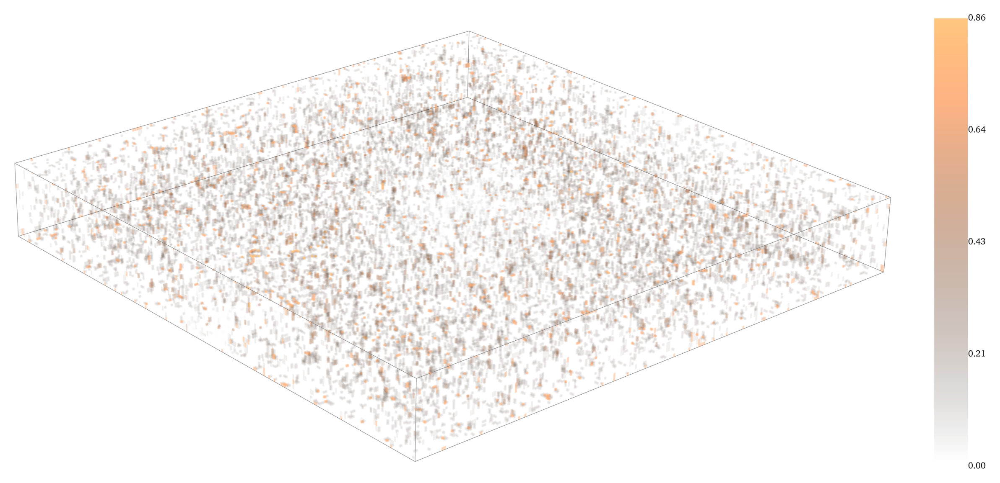

In [9]:
MASK_PERCENT = 0.7
sample_id = 0
f_id = 0
t_id = 0


for x_idx, _, y_idx in test_loader:
    x_idx = x_idx[:6]
    y_idx = y_idx[:6]
    l_fidel = traj_i_test_tensor[0, x_idx].to(device)
    h_fidel = traj_o_test_tensor[0, y_idx].to(device)

    l_fidel, h_true = random_point_inpainting_prep(l_fidel, h_fidel, min_percent=MASK_PERCENT, max_percent=MASK_PERCENT)
    # l_fidel, h_true = reg_invertpainting_prep(l_fidel, h_fidel)

    break

field = l_fidel[sample_id,:-1].detach().cpu().numpy()
field = 0.5 * (field[0]**2 + field[1]**2 + field[2]**2)
# field = field[f_id]

mask = l_fidel[sample_id,4+0].detach().cpu().numpy()


VMIN = np.min(field)
VMAX = np.max(field)

image = plot_volume_rendering(field, mask, opacity=1, clim=[VMIN,VMAX], CMAP='copper', show_colorbar=True)
# image = plot_volume_rendering(field, opacity=0.2, clim=[VMIN,VMAX], CMAP='viridis', show_colorbar=True)
# image = plot_midplane_slices(field, clim=[VMIN,VMAX], CMAP='viridis')


plt.figure(figsize=(10, 10))
plt.imshow(image)
plt.axis("off")
# plt.title(title)
plt.show()

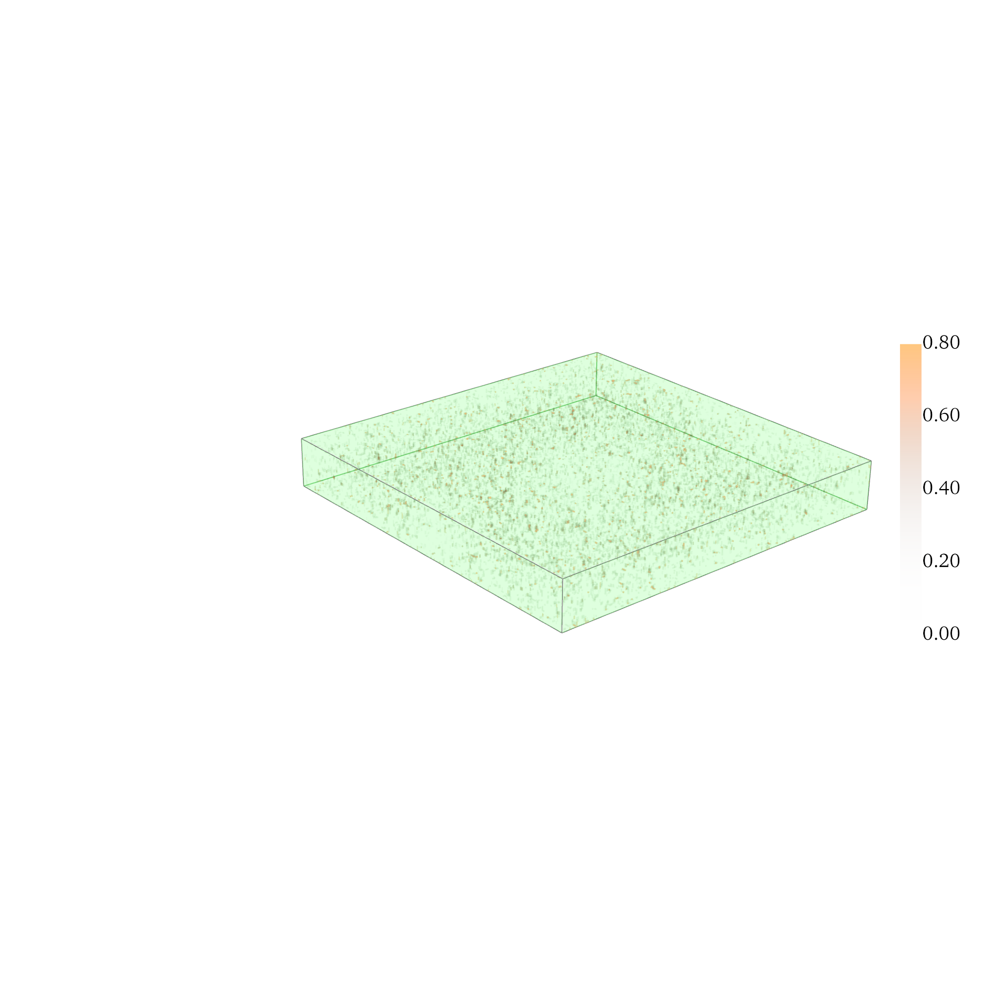

In [13]:
MASK_PERCENT = 0.7
sample_id = 0
f_id = 0
t_id = 0


for x_idx, _, y_idx in test_loader:
    x_idx = x_idx[:6]
    y_idx = y_idx[:6]
    l_fidel = traj_i_test_tensor[0, x_idx].to(device)
    h_fidel = traj_o_test_tensor[0, y_idx].to(device)

    l_fidel, h_true = random_point_inpainting_prep(l_fidel, h_fidel, min_percent=MASK_PERCENT, max_percent=MASK_PERCENT)
    # l_fidel, h_true = reg_invertpainting_prep(l_fidel, h_fidel)

    break

field = l_fidel[sample_id,:-1].detach().cpu().numpy()
field = 0.5 * (field[0]**2 + field[1]**2 + field[2]**2)
# field = field[f_id]

mask = l_fidel[sample_id,4+0].detach().cpu().numpy()

nx, ny, nz = mask.shape
highlight_mask = torch.ones((nx, ny, nz), device=device, dtype=DTYPE).detach().cpu().numpy()


VMIN = np.min(field)
VMAX = np.max(field)

image = plot_volume_rendering(field, mask, opacity=1, clim=[VMIN,VMAX], CMAP='copper', show_colorbar=True, make_transparent=True, highlight_mask=highlight_mask)
# image = plot_volume_rendering(field, opacity=0.2, clim=[VMIN,VMAX], CMAP='viridis', show_colorbar=True)
# image = plot_midplane_slices(field, clim=[VMIN,VMAX], CMAP='viridis')


plt.figure(figsize=(10, 10))
plt.imshow(image)
plt.axis("off")
os.makedirs("transparent_images", exist_ok=True)
plt.savefig("transparent_images/sparse_vel.png", transparent=True, dpi=300)
plt.show()

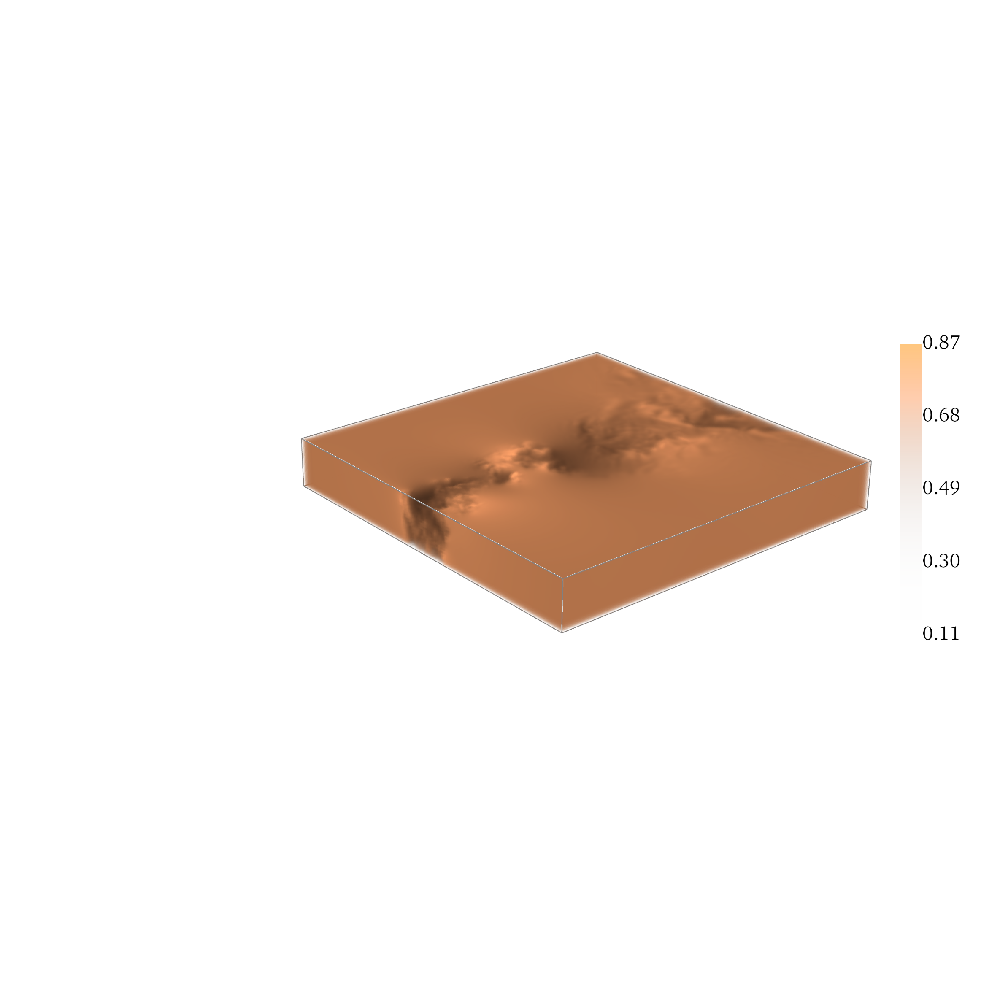

In [14]:
MASK_PERCENT = 0.7
sample_id = 0
f_id = 0
t_id = 0


for x_idx, _, y_idx in test_loader:
    x_idx = x_idx[:6]
    y_idx = y_idx[:6]
    l_fidel = traj_i_test_tensor[0, x_idx].to(device)
    h_fidel = traj_o_test_tensor[0, y_idx].to(device)

    l_fidel, h_true = random_point_inpainting_prep(l_fidel, h_fidel, min_percent=MASK_PERCENT, max_percent=MASK_PERCENT)
    # l_fidel, h_true = reg_invertpainting_prep(l_fidel, h_fidel)

    break

field = h_fidel[sample_id, :-1].detach().cpu().numpy()
field = 0.5 * (field[0]**2 + field[1]**2 + field[2]**2)
# field = field[f_id]

# mask = l_fidel[sample_id,-1].detach().cpu().numpy()


VMIN = np.min(field)
VMAX = np.max(field)

image = plot_volume_rendering(field, opacity=1, clim=[VMIN,VMAX], CMAP='copper', show_colorbar=True, make_transparent=True)
# image = plot_volume_rendering(field, opacity=0.2, clim=[VMIN,VMAX], CMAP='viridis', show_colorbar=True)
# image = plot_midplane_slices(field, clim=[VMIN,VMAX], CMAP='viridis')


plt.figure(figsize=(10, 10))
plt.imshow(image)
plt.axis("off")
plt.savefig("transparent_images/full_vel.png", transparent=True, dpi=300)
plt.show()

torch.Size([6, 8, 256, 256, 32])


sampling time step: 100%|██████████| 32/32 [00:10<00:00,  3.03it/s]
/tmp/ipykernel_2901465/2980876318.py:78: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  u_all = torch.tensor(u_all, dtype=DTYPE, device=device) # [3, ntime, nx, ny, nz]


x: torch.Size([6, 8, 1, 256, 256, 32])
true: torch.Size([6, 4, 1, 256, 256, 32])
true: torch.Size([6, 4, 1, 256, 256, 32])

Saving ...



/tmp/ipykernel_2901465/211261035.py:121: RuntimeWarning: divide by zero encountered in power
  axes[3].loglog(wave_numbers, wave_numbers**(-5/3), label="slope = -5/3", color="magenta", ls="dotted")


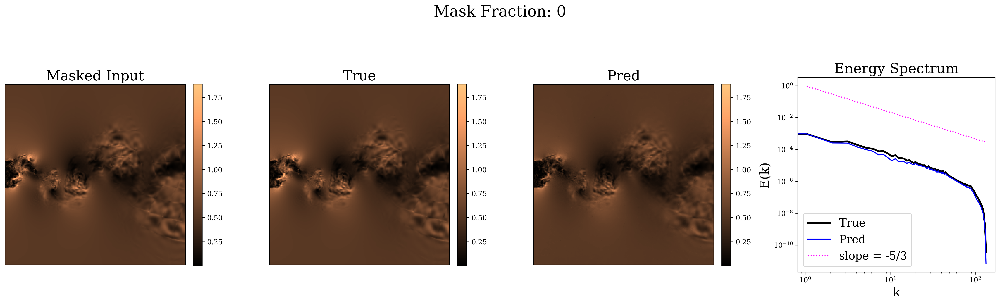

torch.Size([6, 8, 256, 256, 32])


sampling time step: 100%|██████████| 32/32 [00:10<00:00,  3.03it/s]


x: torch.Size([6, 8, 1, 256, 256, 32])
true: torch.Size([6, 4, 1, 256, 256, 32])
true: torch.Size([6, 4, 1, 256, 256, 32])

Saving ...



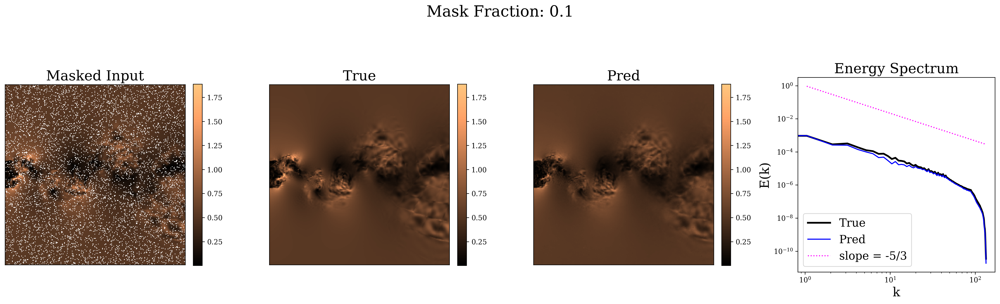

torch.Size([6, 8, 256, 256, 32])


sampling time step: 100%|██████████| 32/32 [00:10<00:00,  3.03it/s]


x: torch.Size([6, 8, 1, 256, 256, 32])
true: torch.Size([6, 4, 1, 256, 256, 32])
true: torch.Size([6, 4, 1, 256, 256, 32])

Saving ...



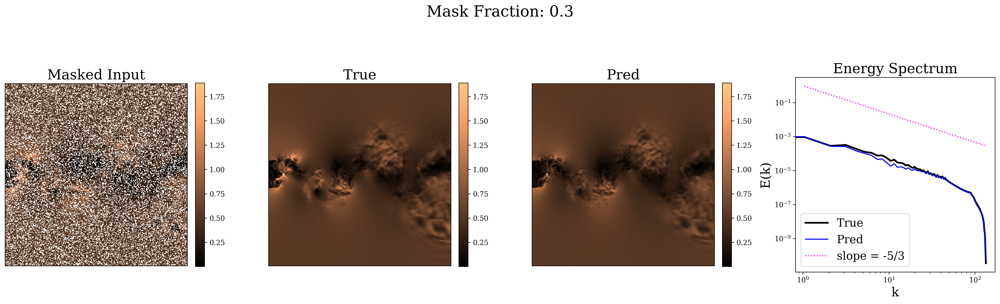

torch.Size([6, 8, 256, 256, 32])


sampling time step: 100%|██████████| 32/32 [00:10<00:00,  3.03it/s]


x: torch.Size([6, 8, 1, 256, 256, 32])
true: torch.Size([6, 4, 1, 256, 256, 32])
true: torch.Size([6, 4, 1, 256, 256, 32])

Saving ...



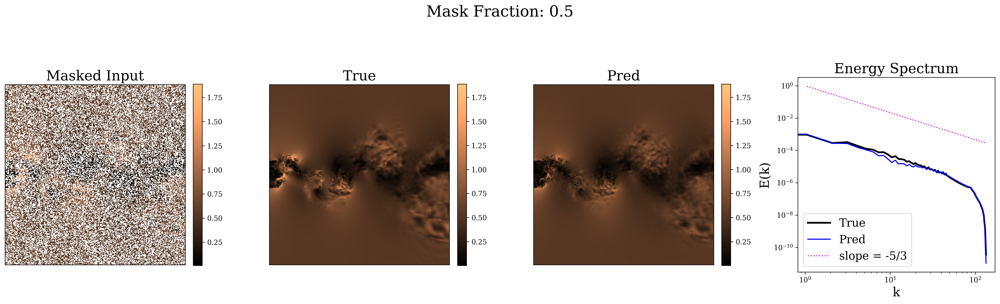

torch.Size([6, 8, 256, 256, 32])


sampling time step: 100%|██████████| 32/32 [00:10<00:00,  3.03it/s]


x: torch.Size([6, 8, 1, 256, 256, 32])
true: torch.Size([6, 4, 1, 256, 256, 32])
true: torch.Size([6, 4, 1, 256, 256, 32])

Saving ...



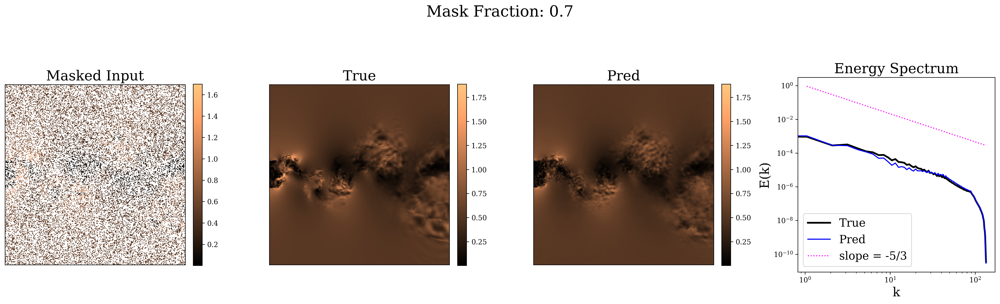

torch.Size([6, 8, 256, 256, 32])


sampling time step: 100%|██████████| 32/32 [00:10<00:00,  3.03it/s]


x: torch.Size([6, 8, 1, 256, 256, 32])
true: torch.Size([6, 4, 1, 256, 256, 32])
true: torch.Size([6, 4, 1, 256, 256, 32])

Saving ...



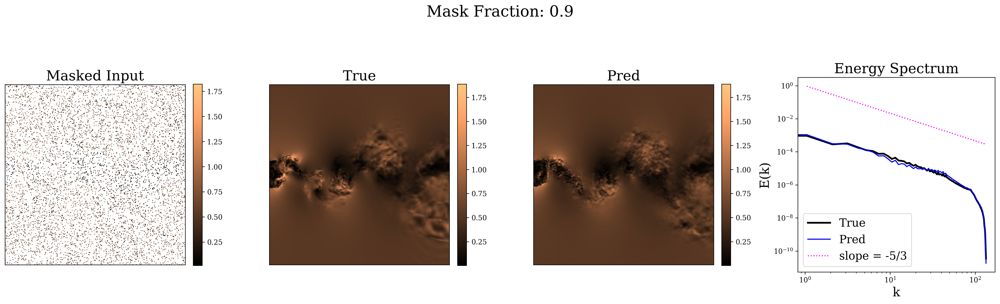

torch.Size([6, 8, 256, 256, 32])


sampling time step: 100%|██████████| 32/32 [00:10<00:00,  3.03it/s]


x: torch.Size([6, 8, 1, 256, 256, 32])
true: torch.Size([6, 4, 1, 256, 256, 32])
true: torch.Size([6, 4, 1, 256, 256, 32])

Saving ...



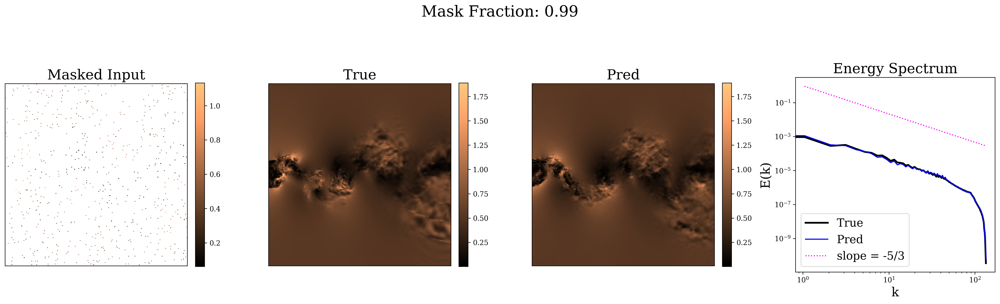

In [24]:
torch.manual_seed(23)


for mp in [0, 0.1, 0.3, 0.5, 0.7, 0.9, 0.99]:
# for mp in [1.0]:
        
    MASK_PERCENT = mp
    
    l_fidel_ls = []
    y_pred_ls = []
    y_true_ls = []
    
    model.eval()
    test_loss = 0.0
    with torch.no_grad():
        for x_idx, _, y_idx in test_loader:
            x_idx = x_idx[:6]
            y_idx = y_idx[:6]
            l_fidel = traj_i_test_tensor[0, x_idx].to(device)
            h_fidel = traj_o_test_tensor[0, y_idx].to(device)

            l_fidel, h_true = random_point_inpainting_prep(l_fidel, h_fidel, min_percent=MASK_PERCENT, max_percent=MASK_PERCENT)
    
            print(l_fidel.shape)
            if True:
                pred = model.sample(l_fidel.to(device), num_sample_steps=32)
                loss   = error_metric(pred, h_fidel.to(device), Par)
            test_loss += loss.item()
            l_fidel_ls.append(l_fidel)
            y_true_ls.append(h_fidel)
            y_pred_ls.append(pred)
            break
    
    x, true, pred = l_fidel, h_fidel, y_pred_ls[0]  
    
    
    x    = x.unsqueeze(2)
    true = true.unsqueeze(2)
    pred = pred.unsqueeze(2)

    
    # print(x.shape)
    
    # x = x*Par['inp_scale'][:,0,:4] + Par['inp_shift'][:,0,:4]
    # x = (x - Par['out_shift'][:,0,:4])/Par['out_scale'][:,0,:4]
    
    print(f'x: {x.shape}')
    print(f'true: {true.shape}')
    print(f'true: {true.shape}')
    
    sample_id = 0 #random.randint(0, x.shape[0]-1)
    f_id = 0
    t_id = 0
    z_id = 16
    
    CMAP = "copper"
    
    lx,ly,lz = 8,8,2
    
    knyquist, wave_numbers, spectrum_true = compute_tke_spectrum_timeseries_torch( true[sample_id, :3], lx,ly,lz, device=device  )
    knyquist, wave_numbers, spectrum_pred = compute_tke_spectrum_timeseries_torch( pred[sample_id, :3], lx,ly,lz, device=device  )
    
    
    s_err = np.mean( (np.log(spectrum_true[:,:])-np.log(spectrum_pred[:,:]) )**2 )

    MASK_og = x[:, 4:5]
    MASK = x[sample_id, 4, t_id, :, :, z_id]
    MASK = MASK.detach().cpu().numpy()

    # X = x[:,:4]
    
    # X = X*Par['inp_scale'].permute(0,2,1,3,4,5) + Par['inp_shift'].permute(0,2,1,3,4,5)
    # X = (X - Par['out_shift']).permute(0,2,1,3,4,5)/Par['out_scale'].permute(0,2,1,3,4,5)

    x = x[:,:4] * Par['inp_scale'].permute(0,2,1,3,4,5) + Par['inp_shift'].permute(0,2,1,3,4,5)
    true = true * Par['out_scale'].permute(0,2,1,3,4,5) + Par['out_shift'].permute(0,2,1,3,4,5)
    pred = pred * Par['out_scale'].permute(0,2,1,3,4,5) + Par['out_shift'].permute(0,2,1,3,4,5)

    print()
    print('Saving ...')
    os.makedirs('random_point_reconstruction', exist_ok=True)
    np.savez(f'random_point_reconstruction/data_{mp}.npz', x=x.detach().cpu().numpy(), true=true.detach().cpu().numpy(), pred=pred.detach().cpu().numpy(), MASK_og=MASK_og.detach().cpu().numpy())

    print()
    
    
    X = get_ke(x[sample_id])[t_id, :, :, z_id].detach().cpu().numpy()
    T = get_ke(true[sample_id])[t_id, :, :, z_id].detach().cpu().numpy()
    P = get_ke(pred[sample_id])[t_id, :, :, z_id].detach().cpu().numpy()
    
    
    masked_X = np.ma.masked_where(MASK == 0, X)
    
    VMIN = np.min(T)
    VMAX = np.max(T)
    # VMIN = -1
    # VMAX = +

    
    fig, axes = plt.subplots(1,4, figsize=(20,5))
    im = axes[0].imshow(masked_X, cmap=CMAP, interpolation='none')
    axes[0].set_title("Masked Input", fontsize=20)
    fig.colorbar(im, ax=axes[0], fraction=0.046, pad=0.04)
    axes[0].set_xticks([])
    axes[0].set_yticks([])
    
    im = axes[1].imshow(T, cmap=CMAP, vmin=VMIN, vmax=VMAX)
    axes[1].set_title("True", fontsize=20)
    fig.colorbar(im, ax=axes[1], fraction=0.046, pad=0.04)
    axes[1].set_xticks([])
    axes[1].set_yticks([])
    
    im = axes[2].imshow(P, cmap=CMAP, vmin=VMIN, vmax=VMAX)
    axes[2].set_title("Pred", fontsize=20)
    fig.colorbar(im, ax=axes[2], fraction=0.046, pad=0.04)
    axes[2].set_xticks([])
    axes[2].set_yticks([])
    
    axes[3].loglog(wave_numbers, spectrum_true[t_id], label="True", color="black", lw=2.5)
    axes[3].loglog(wave_numbers, spectrum_pred[t_id], label="Pred", color="blue", lw=1.5)
    axes[3].loglog(wave_numbers, wave_numbers**(-5/3), label="slope = -5/3", color="magenta", ls="dotted")
    axes[3].legend(fontsize=16)
    axes[3].set_title('Energy Spectrum', fontsize=20)
    axes[3].set_xlabel("k", fontsize = 18)
    axes[3].set_ylabel("E(k)", fontsize=18)
    
    
    
    plt.tight_layout()
    
    
    fig.suptitle(f"Mask Fraction: {MASK_PERCENT}", fontsize=22, y=1.2)
    plt.show()
    # plt.savefig(f"images/{epoch}.png", dpi=150, bbox_inches='tight')
    plt.close()

# Test Setup 2 - Saving Predictions

In [11]:

def plot_midplane_slices(field, clim, title="", CMAP="viridis", show_colorbar=True, make_transparent=False):
    """
    Visualize only the three central orthogonal slices (XY, YZ, XZ) of a 3D volume.
    - field: 3D NumPy array of shape [nx, ny, nz]
    - clim: [min, max] color limits
    - title: optional title (not used in off-screen render)
    - CMAP: colormap name
    """
    volume = field.transpose(1,0,2)[6:-6,6:-6,8:24]
    nx, ny, nz = volume.shape

    # # Create a PyVista ImageData object with cell scalars "KE"
    # grid = pv.ImageData(dimensions=np.array(volume.shape) + 1)
    # grid.spacing = (1, 1, 2)
    # grid.origin = (0, 0, 0)

    # Compute spacing
    dx = 8/256
    dy = 8/256
    dz = 2/32

    # print(volume.shape)

    # Create PyVista ImageData for volume rendering
    grid = pv.ImageData(dimensions=np.array(volume.shape) + 1)
    grid.spacing = (dx, dy, dz)  # Modify as needed
    grid.origin = (0.75, -4, 2.3)

    
    # grid.cell_data[""] = volume.flatten(order="F")
    grid.cell_data[""] = volume.flatten(order="F")

    # Given your dx, dy, dz and origin:
    origin_x, origin_y, origin_z = 0.75, -4.0, 2.3
    
    mid_i = nx // 2   # integer index of mid‐cell in x
    mid_j = ny // 2   # mid‐cell in y
    mid_k = nz // 2   # mid‐cell in z
    
    # World‐space planes:
    slice_x = origin_x + mid_i * dx
    slice_y = origin_y + mid_j * dy
    slice_z = origin_z + mid_k * dz
    
    # Then:
    slices = grid.slice_orthogonal(
        x=slice_x,
        y=slice_y,
        z=slice_z,
    )[-1:]
    
    # # Compute mid‐coordinates in world‐space
    # mid_x = nx / 2.0
    # mid_y = ny / 2.0
    # mid_z = nz / 2.0

    # # Generate the three orthogonal slices at mid‐planes
    # slices = grid.slice_orthogonal(x=mid_x, y=mid_y, z=mid_z)

    # Set up an off‐screen PyVista Plotter
    plotter = pv.Plotter(off_screen=True)

    # 1) Make the overall background white (so unused viewport area isn't black)
    plotter.set_background("white")
    
    # Shrink the 3D render area to the left 80% of the window
    # plotter.renderer.SetViewport(0.0, 0.0, 0.8, 1.0)

    # # 2) Force the leftover right 20% to white
    # plotter.renderer.SetBackground(1.0, 1.0, 1.0)

    # after building grid and before slicing…
    outline = grid.outline(generate_faces=False)  
    plotter.add_mesh(outline, color="grey", line_width=2.5, lighting=False)

    # Add each slice to the scene
    for block in slices:
        plotter.add_mesh(
            block,
            scalars="",
            cmap=CMAP,
            clim=clim,
            show_scalar_bar=False  # disable per‐slice bar
        )

    # Optional: add a bounding box
    plotter.add_bounding_box(color="grey", line_width=2.5)

    # Add a single vertical colorbar on the right
    if show_colorbar:
        cbar = plotter.add_scalar_bar(
            title="",
            n_labels=5,
            vertical=True,
            position_x=0.91,   # x‐fraction (0–1), 0.85 pushes it to the right
            position_y=0.36,    # y‐fraction (0–1), 0.2 moves it up from bottom
            width=0.06,         # fraction of window width
            height=0.3         # fraction of window height
        )
        # Increase tick label font size
        cbar.GetLabelTextProperty().SetFontSize(48)
        cbar.GetLabelTextProperty().SetFontFamilyToTimes()
        # Force all tick labels to use two decimals (e.g. 1.23 instead of 1.231)
        cbar.SetLabelFormat("%.2f")

    # Camera configuration: placed to see all three slices
    center = np.array(grid.bounds[1::2]) / 2
    offset = np.array([-10,-10,+5])
    diagonal_vector = np.array([-0.7, -1, 0.65]) #np.array([1, 1, 0.7])  # adjust if you want a different angle
    camera_distance = 1.6 * np.linalg.norm(grid.bounds[1::2])
    camera_position = center + offset + camera_distance * diagonal_vector
    plotter.camera_position = [camera_position, center, [0, 0, 1]]


    # Add a light source at the camera position, pointing toward the center
    light = pv.Light(
        position=camera_position,
        focal_point=center,
        color='white',
        light_type='scenelight'  # ensures it lights the entire scene
    )
    plotter.add_light(light)

    # Take a screenshot (returns an RGB image array)
    if make_transparent==False:
        image = plotter.screenshot(return_img=True, window_size=[8000, 8000])
        plotter.close()
    
        # 4) Crop with a small white margin (pad = 10 pixels)
        arr = image  # shape [H, W, 3], dtype=uint8
        white = np.array([255, 255, 255], dtype=np.uint8)
        tol = 1
    
        H, W, _ = arr.shape
    
        # Identify rows that are (nearly) all white
        is_row_white = np.all(np.abs(arr - white) <= tol, axis=(1, 2))
        nonwhite_rows = np.where(~is_row_white)[0]
        if nonwhite_rows.size:
            top, bottom = nonwhite_rows[0], nonwhite_rows[-1]
        else:
            top, bottom = 0, H - 1
    
        # Identify columns that are (nearly) all white
        is_col_white = np.all(np.abs(arr - white) <= tol, axis=(0, 2))
        nonwhite_cols = np.where(~is_col_white)[0]
        if nonwhite_cols.size:
            left, right = nonwhite_cols[0], nonwhite_cols[-1]
        else:
            left, right = 0, W - 1
    
        # Add padding but clamp to image bounds
        pad = 10
        top = max(0, top - pad)
        bottom = min(H - 1, bottom + pad)
        left = max(0, left - pad)
        right = min(W - 1, right + pad)
    
        cropped = arr[top: bottom + 1, left: right + 1, :]
    
        return cropped
    else: 
        plotter.set_background('white', top=None)
        plotter.background_alpha = 0.0
        
        image = plotter.screenshot(return_img=True, transparent_background=True, window_size=[2400, 2400])
        plotter.close()

        return image
    

In [12]:


def plane_to_full_field(x: torch.Tensor, y: torch.Tensor,
                                  min_percent: float = 0.0, max_percent: float = 1.0, Z_IDX: int = 16):
    """
    x: torch.Tensor of shape [bs, nf, nx, ny, nz]
    y: torch.Tensor of shape [bs, nf, nx, ny, nz]

    Returns:
      x_in: [bs, nf+1, nx, ny, nz] - randomly masked x concatenated with mask
      y   : unchanged target
    """
    bs, nf, nx, ny, nz = x.shape
    device, dtype = x.device, x.dtype
    total_voxels = nx * ny * nz

    # Create empty mask container
    mask = torch.ones((bs, 1, nx, ny, nz), device=device, dtype=dtype)

    for b in range(bs):
        # Sample a random masking percentage for this sample
        masking_percent = random.uniform(min_percent, max_percent)
        num_masked_voxels = int(total_voxels * masking_percent)

        # Generate random indices to mask
        indices = torch.randperm(total_voxels, device=device)[:num_masked_voxels]

        # Convert flat indices to 3D coordinates
        x_idx = indices // (ny * nz)
        y_idx = (indices % (ny * nz)) // nz
        z_idx = indices % nz

        # Apply masking
        mask[b, 0, x_idx, y_idx, z_idx] = 0

    temp_mask = torch.zeros((bs, 1, nx, ny, nz), device=device, dtype=dtype)

    # Set the mid z-slice to 1
    for item in Z_IDX:
        temp_mask[:, 0, :, :, item] = 1.0

    mask1 = mask*temp_mask

    
    mask1 = mask1.repeat(1,4,1,1,1)
    # Apply the mask to x
    x_masked = x * mask1  # broadcast along channel dim

    # Concatenate mask as extra channel
    x_in = torch.cat([x_masked, mask1], dim=1)  # [bs, nf+1, nx, ny, nz]

    return x_in, y

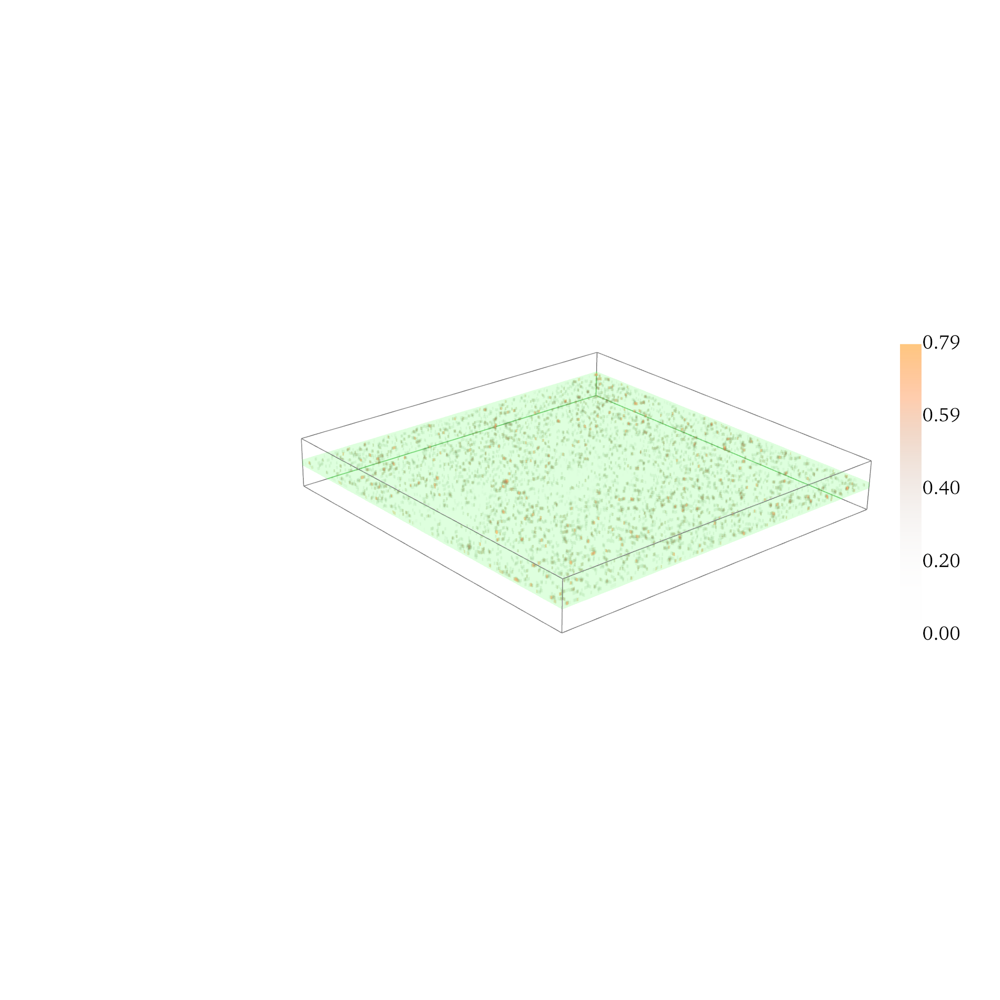

In [13]:
MASK_PERCENT = 0.5
Z_IDX = 15
Z_IDX_LS = [Z_IDX, Z_IDX+1]
sample_id = 0
f_id = 0
t_id = 0


for x_idx, _, y_idx in test_loader:
    x_idx = x_idx[:6]
    y_idx = y_idx[:6]
    l_fidel = traj_i_test_tensor[0, x_idx].to(device)
    h_fidel = traj_o_test_tensor[0, y_idx].to(device)

    l_fidel, h_true = plane_to_full_field(l_fidel, h_fidel, min_percent=MASK_PERCENT, max_percent=MASK_PERCENT, Z_IDX=Z_IDX_LS)
    # l_fidel, h_true = plane_to_full_field(l_fidel, h_fidel, z_idx=Z_IDX)
    # l_fidel, h_true = reg_invertpainting_prep(l_fidel, h_fidel)

    break

field = l_fidel[sample_id,:-1].detach().cpu().numpy()
field = 0.5 * (field[0]**2 + field[1]**2 + field[2]**2)
# field = field[f_id]

mask = l_fidel[sample_id,-1].detach().cpu().numpy()


nx, ny, nz = mask.shape
highlight_mask = np.zeros((nx, ny, nz))

# Set the mid z-slice to 1
for item in Z_IDX_LS:
    highlight_mask[:, :, item] = 1.0



VMIN = np.min(field)
VMAX = np.max(field)


# image = plot_volume_rendering(field, mask, opacity=1, clim=[VMIN,VMAX], CMAP='copper', show_colorbar=True)
# image = plot_volume_rendering(field, opacity=0.2, clim=[VMIN,VMAX], CMAP='viridis', show_colorbar=True)
# image = plot_midplane_slices(field, clim=[VMIN,VMAX], CMAP='copper')
image = plot_volume_rendering(field, mask, opacity=0.7, clim=[VMIN,VMAX], CMAP='copper', show_colorbar=True, make_transparent=True, 
                              highlight_mask=highlight_mask, highlight_color=(0.0, 1.0, 0.0))


plt.figure(figsize=(10, 10))
plt.imshow(image)
plt.axis("off")
plt.savefig(f'transparent_images/plane_vel.png', transparent=True, dpi=300)
# plt.title(title)
plt.show()

torch.Size([6, 8, 256, 256, 32])


sampling time step: 100%|██████████| 32/32 [00:10<00:00,  3.03it/s]
/tmp/ipykernel_2901465/2980876318.py:78: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  u_all = torch.tensor(u_all, dtype=DTYPE, device=device) # [3, ntime, nx, ny, nz]


x: torch.Size([6, 8, 1, 256, 256, 32])
true: torch.Size([6, 4, 1, 256, 256, 32])
true: torch.Size([6, 4, 1, 256, 256, 32])

Saving ...



/tmp/ipykernel_2901465/3371959919.py:116: RuntimeWarning: divide by zero encountered in power
  axes[3].loglog(wave_numbers, wave_numbers**(-5/3), label="slope = -5/3", color="magenta", ls="dotted")


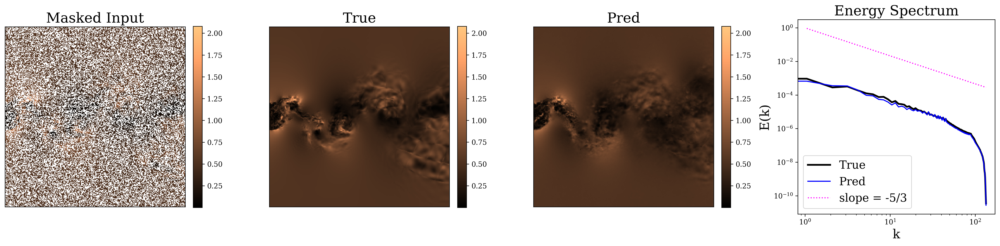

In [17]:
torch.manual_seed(23)

MASK_PERCENT = 0.5

Z_IDX=15
Z_IDX_LS = [Z_IDX]


l_fidel_ls = []
y_pred_ls = []
y_true_ls = []

model.eval()
test_loss = 0.0
with torch.no_grad():
    for x_idx, _, y_idx in test_loader:
        x_idx = x_idx[:6]
        y_idx = y_idx[:6]
        l_fidel = traj_i_test_tensor[0, x_idx].to(device)
        h_fidel = traj_o_test_tensor[0, y_idx].to(device)

        l_fidel, h_true = plane_to_full_field(l_fidel, h_fidel, min_percent=MASK_PERCENT, max_percent=MASK_PERCENT, Z_IDX=Z_IDX_LS)

        print(l_fidel.shape)

        if True:
            pred = model.sample(l_fidel.to(device), num_sample_steps=32)
            loss   = error_metric(pred, h_fidel.to(device), Par)
        test_loss += loss.item()
        l_fidel_ls.append(l_fidel)
        y_true_ls.append(h_fidel)
        y_pred_ls.append(pred)
        break

x, true, pred = l_fidel, h_fidel, y_pred_ls[0]  


x    = x.unsqueeze(2)
true = true.unsqueeze(2)
pred = pred.unsqueeze(2)

print(f'x: {x.shape}')
print(f'true: {true.shape}')
print(f'true: {true.shape}')

sample_id = 0 #random.randint(0, x.shape[0]-1)
f_id = 0
t_id = 0
z_id = 15

CMAP = "copper"

lx,ly,lz = 8,8,2

knyquist, wave_numbers, spectrum_true = compute_tke_spectrum_timeseries_torch( true[sample_id, :3], lx,ly,lz, device=device  )
knyquist, wave_numbers, spectrum_pred = compute_tke_spectrum_timeseries_torch( pred[sample_id, :3], lx,ly,lz, device=device  )


s_err = np.mean( (np.log(spectrum_true[:,:])-np.log(spectrum_pred[:,:]) )**2 )

MASK_og = x[:, -1:]
MASK = x[sample_id, -1, t_id, :, :, z_id]
MASK = MASK.detach().cpu().numpy()

# X = x[:,:4]

# X = X*Par['inp_scale'].permute(0,2,1,3,4,5) + Par['inp_shift'].permute(0,2,1,3,4,5)
# X = (X - Par['out_shift']).permute(0,2,1,3,4,5)/Par['out_scale'].permute(0,2,1,3,4,5)

x = x[:,:4] * Par['inp_scale'].permute(0,2,1,3,4,5) + Par['inp_shift'].permute(0,2,1,3,4,5)
true = true * Par['out_scale'].permute(0,2,1,3,4,5) + Par['out_shift'].permute(0,2,1,3,4,5)
pred = pred * Par['out_scale'].permute(0,2,1,3,4,5) + Par['out_shift'].permute(0,2,1,3,4,5)

print()
print('Saving ...')
os.makedirs('plane_to_full_field', exist_ok=True)
np.savez(f'plane_to_full_field/data.npz', x=x.detach().cpu().numpy(), true=true.detach().cpu().numpy(), pred=pred.detach().cpu().numpy(), MASK_og=MASK_og.detach().cpu().numpy())

print()


X = get_ke(x[sample_id])[t_id, :, :, z_id].detach().cpu().numpy()
T = get_ke(true[sample_id])[t_id, :, :, z_id].detach().cpu().numpy()
P = get_ke(pred[sample_id])[t_id, :, :, z_id].detach().cpu().numpy()


masked_X = np.ma.masked_where(MASK == 0, X)

VMIN = np.min(T)
VMAX = np.max(T)
# VMIN = -1
# VMAX = +


fig, axes = plt.subplots(1,4, figsize=(20,5))
im = axes[0].imshow(masked_X, cmap=CMAP, interpolation='none')
axes[0].set_title("Masked Input", fontsize=20)
fig.colorbar(im, ax=axes[0], fraction=0.046, pad=0.04)
axes[0].set_xticks([])
axes[0].set_yticks([])

im = axes[1].imshow(T, cmap=CMAP, vmin=VMIN, vmax=VMAX)
axes[1].set_title("True", fontsize=20)
fig.colorbar(im, ax=axes[1], fraction=0.046, pad=0.04)
axes[1].set_xticks([])
axes[1].set_yticks([])

im = axes[2].imshow(P, cmap=CMAP, vmin=VMIN, vmax=VMAX)
axes[2].set_title("Pred", fontsize=20)
fig.colorbar(im, ax=axes[2], fraction=0.046, pad=0.04)
axes[2].set_xticks([])
axes[2].set_yticks([])

axes[3].loglog(wave_numbers, spectrum_true[t_id], label="True", color="black", lw=2.5)
axes[3].loglog(wave_numbers, spectrum_pred[t_id], label="Pred", color="blue", lw=1.5)
axes[3].loglog(wave_numbers, wave_numbers**(-5/3), label="slope = -5/3", color="magenta", ls="dotted")
axes[3].legend(fontsize=16)
axes[3].set_title('Energy Spectrum', fontsize=20)
axes[3].set_xlabel("k", fontsize = 18)
axes[3].set_ylabel("E(k)", fontsize=18)



plt.tight_layout()


plt.show()
plt.close()

# Test Setup 3 - Saving Predictions

In [18]:
def reg_invertpainting_prep(x: torch.Tensor, y: torch.Tensor, x0=96, y0=32, z0=12, lx=32, ly=32, lz=8, min_percent=0.0, max_percent=1.0):
    """
    x: torch.Tensor of shape [bs, nf, nx, ny, nz]
    y: torch.Tensor of shape [bs, nf, nx, ny, nz]  (same content as x[:,0])
    
    Returns:
      x_in: [bs, nf+1, nx, ny, nz]  (masked x with mask concatenated)
      y    : unchanged target tensor
    """
    bs, nf, nx, ny, nz = x.shape
    device, dtype = x.device, x.dtype

    total_voxels = nx * ny * nz

    # Create empty mask container
    mask = torch.ones((bs, 1, nx, ny, nz), device=device, dtype=dtype)

    for b in range(bs):
        # Sample a random masking percentage for this sample
        masking_percent = random.uniform(min_percent, max_percent)
        num_masked_voxels = int(total_voxels * masking_percent)

        # Generate random indices to mask
        indices = torch.randperm(total_voxels, device=device)[:num_masked_voxels]

        # Convert flat indices to 3D coordinates
        x_idx = indices // (ny * nz)
        y_idx = (indices % (ny * nz)) // nz
        z_idx = indices % nz

        # Apply masking
        mask[b, 0, x_idx, y_idx, z_idx] = 0

    # 1) Build mask: shape [bs,1,1,nx,ny,nz], same mask for all batch entries
    #    Start all ones, then zero out 1–4 random patches.
    temp_mask = torch.zeros((bs, 1, nx, ny, nz), device=device, dtype=dtype)
    num_patches = 1 #random.choice([1, 2, 3, 4])
    for _ in range(num_patches):
        # random patch size up to 25% of each dim (but at least 1)
        # lx = random.randint(1, max(1, int(mask_size * nx)))
        # ly = random.randint(1, max(1, int(mask_size * ny)))
        # lz = random.randint(1, max(1, int(mask_size * nz)))
        # # random start positions
        # x0 = random.randint(0, nx - lx)
        # y0 = random.randint(0, ny - ly)
        # z0 = random.randint(0, nz - lz)
        # zero out that cuboid
        temp_mask[..., x0:x0+lx, y0:y0+ly, z0:z0+lz] = 1


    mask = mask * temp_mask
    # repeat across batch
    mask = mask.repeat(1, 4, 1, 1, 1)  # [bs,1,nx,ny,nz]

    # mask = 1 - mask

    # 2) apply mask to x
    x_masked = x * mask

    # 3) concatenate mask as an extra feature channel along dim=2
    #    so channel count goes from nf → nf+1
    x_in = torch.cat([x_masked, mask], dim=1)  # → [bs,nf+1,nx,ny,nz]

    # return the prepared input and the original target
    return x_in, y

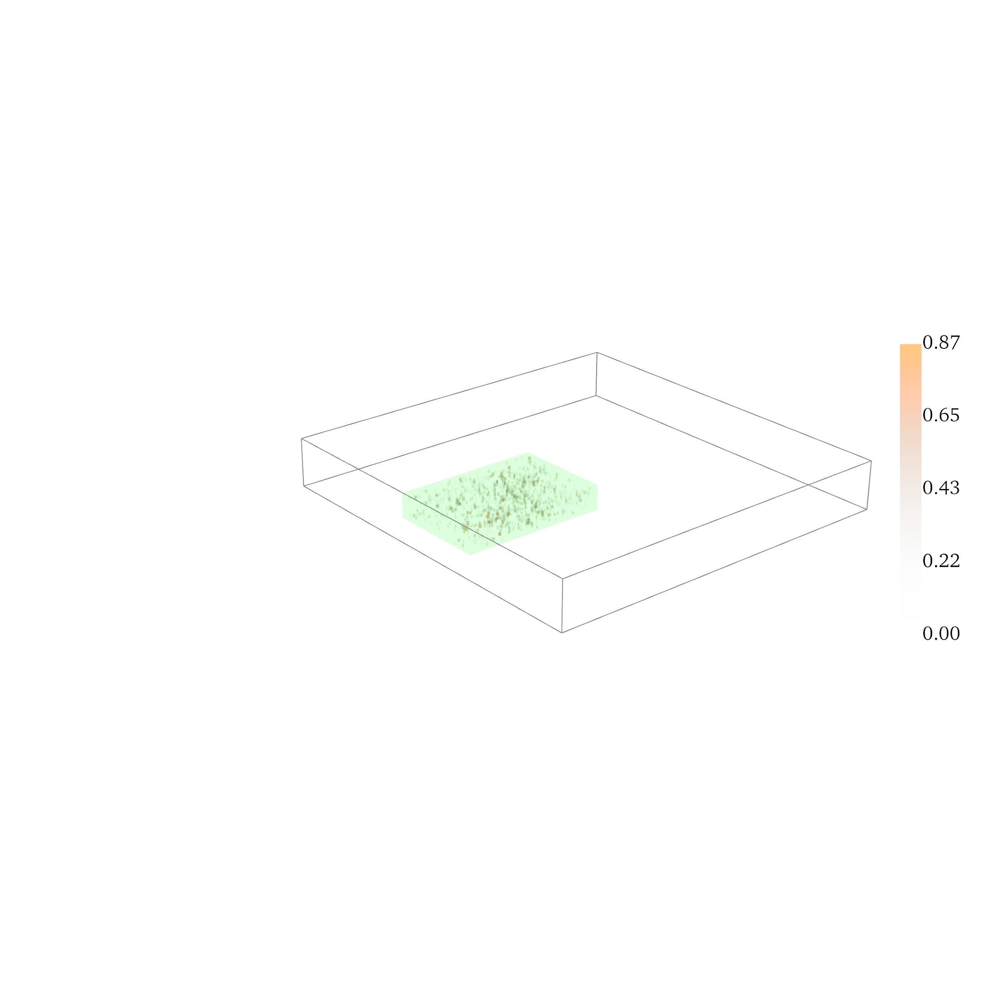

In [19]:
x0=96
y0=16
z0=12
lx=64
ly=96
lz=8

MASK_PERCENT = 0.6

sample_id = 0
f_id = 0
t_id = 0


for x_idx, _, y_idx in test_loader:
    x_idx = x_idx[:6]
    y_idx = y_idx[:6]
    l_fidel = traj_i_test_tensor[0, x_idx].to(device)
    h_fidel = traj_o_test_tensor[0, y_idx].to(device)

    # l_fidel, h_true = random_point_inpainting_prep(l_fidel, h_fidel, min_percent=MASK_PERCENT, max_percent=MASK_PERCENT)
    l_fidel, h_true = reg_invertpainting_prep(l_fidel, h_fidel, x0,y0,z0,lx,ly,lz, min_percent=MASK_PERCENT, max_percent=MASK_PERCENT)

    break

field = l_fidel[sample_id,:-1].detach().cpu().numpy()
field = 0.5 * (field[0]**2 + field[1]**2 + field[2]**2)
# field = field[f_id]

mask = l_fidel[sample_id,-1].detach().cpu().numpy()


nx, ny, nz = mask.shape
highlight_mask = np.zeros((nx, ny, nz))
highlight_mask[x0:x0+lx, y0:y0+ly, z0:z0+lz] = 1



VMIN = np.min(field)
VMAX = np.max(field)

image = plot_volume_rendering(field, mask, opacity=0.7, clim=[VMIN,VMAX], CMAP='copper', show_colorbar=True, make_transparent=True, 
                              highlight_mask=highlight_mask, highlight_color=(0.0, 1.0, 0.0))
# image = plot_volume_rendering(field, mask, opacity=1, clim=[VMIN,VMAX], CMAP='copper', show_colorbar=True)
# image = plot_volume_rendering(field, opacity=0.2, clim=[VMIN,VMAX], CMAP='viridis', show_colorbar=True)
# image = plot_midplane_slices(field, clim=[VMIN,VMAX], CMAP='viridis')


plt.figure(figsize=(10, 10))
plt.imshow(image)
plt.axis("off")
plt.savefig(f'transparent_images/section_vel.png', transparent=True, dpi=300)
# plt.title(title)
plt.show()

torch.Size([2, 8, 256, 256, 32])


sampling time step: 100%|██████████| 32/32 [00:03<00:00,  8.66it/s]
/tmp/ipykernel_2901465/2980876318.py:78: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  u_all = torch.tensor(u_all, dtype=DTYPE, device=device) # [3, ntime, nx, ny, nz]


x: torch.Size([2, 8, 1, 256, 256, 32])
true: torch.Size([2, 4, 1, 256, 256, 32])
true: torch.Size([2, 4, 1, 256, 256, 32])

Saving ...



/tmp/ipykernel_2901465/2344423773.py:123: RuntimeWarning: divide by zero encountered in power
  axes[3].loglog(wave_numbers, wave_numbers**(-5/3), label="slope = -5/3", color="magenta", ls="dotted")


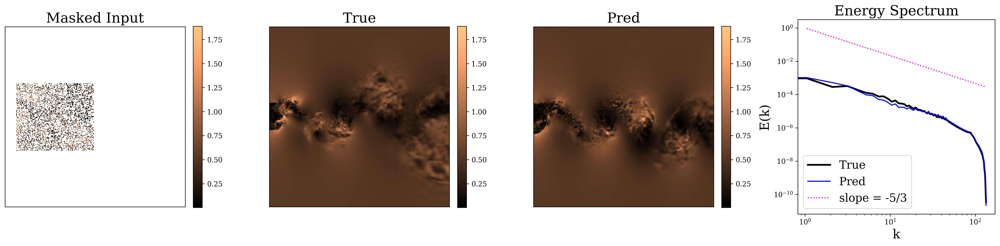

In [20]:
x0=80
y0=16 #16 #24
z0=12
lx=96
ly=110
lz=8


torch.manual_seed(15)

MASK_PERCENT = 0.7

l_fidel_ls = []
y_pred_ls = []
y_true_ls = []

model.eval()
test_loss = 0.0
with torch.no_grad():
    for x_idx, _, y_idx in test_loader:
        x_idx = x_idx[:2]
        y_idx = y_idx[:2]
        l_fidel = traj_i_test_tensor[0, x_idx].to(device)
        h_fidel = traj_o_test_tensor[0, y_idx].to(device)

        l_fidel, h_true = reg_invertpainting_prep(l_fidel, h_fidel, x0,y0,z0,lx,ly,lz, min_percent=MASK_PERCENT, max_percent=MASK_PERCENT)

        # print(torch.min(l_fidel[:,0]), torch.max(l_fidel[:,0]))
        print(l_fidel.shape)

        if True:
            pred = model.sample(l_fidel.to(device), num_sample_steps=32)
            loss   = error_metric(pred, h_fidel.to(device), Par)
        test_loss += loss.item()
        l_fidel_ls.append(l_fidel)
        y_true_ls.append(h_fidel)
        y_pred_ls.append(pred)
        break

x, true, pred = l_fidel, h_fidel, y_pred_ls[0]  


x    = x.unsqueeze(2)
true = true.unsqueeze(2)
pred = pred.unsqueeze(2)


# print(x.shape)

# x = x*Par['inp_scale'][:,0,:4] + Par['inp_shift'][:,0,:4]
# x = (x - Par['out_shift'][:,0,:4])/Par['out_scale'][:,0,:4]

print(f'x: {x.shape}')
print(f'true: {true.shape}')
print(f'true: {true.shape}')

sample_id = 0 #random.randint(0, x.shape[0]-1)
f_id = 0
t_id = 0
z_id = 16

CMAP = "copper"

lx,ly,lz = 8,8,2

knyquist, wave_numbers, spectrum_true = compute_tke_spectrum_timeseries_torch( true[sample_id, :3], lx,ly,lz, device=device  )
knyquist, wave_numbers, spectrum_pred = compute_tke_spectrum_timeseries_torch( pred[sample_id, :3], lx,ly,lz, device=device  )


s_err = np.mean( (np.log(spectrum_true[:,:])-np.log(spectrum_pred[:,:]) )**2 )

MASK_og = x[:, -1:]
MASK = x[sample_id, -1, t_id, :, :, z_id]
MASK = MASK.detach().cpu().numpy()

x = x[:,:4] * Par['inp_scale'].permute(0,2,1,3,4,5) + Par['inp_shift'].permute(0,2,1,3,4,5)
true = true * Par['out_scale'].permute(0,2,1,3,4,5) + Par['out_shift'].permute(0,2,1,3,4,5)
pred = pred * Par['out_scale'].permute(0,2,1,3,4,5) + Par['out_shift'].permute(0,2,1,3,4,5)

print()
print('Saving ...')
os.makedirs('patch_to_full_field', exist_ok=True)
np.savez(f'patch_to_full_field/data.npz', x=x.detach().cpu().numpy(), true=true.detach().cpu().numpy(), pred=pred.detach().cpu().numpy(), MASK_og=MASK_og.detach().cpu().numpy())

print()


X = get_ke(x[sample_id])[t_id, :, :, z_id].detach().cpu().numpy()
T = get_ke(true[sample_id])[t_id, :, :, z_id].detach().cpu().numpy()
P = get_ke(pred[sample_id])[t_id, :, :, z_id].detach().cpu().numpy()


masked_X = np.ma.masked_where(MASK == 0, X)

VMIN = np.min(T)
VMAX = np.max(T)
# VMIN = -1
# VMAX = +


fig, axes = plt.subplots(1,4, figsize=(20,5))
im = axes[0].imshow(masked_X, cmap=CMAP, vmin=VMIN, vmax=VMAX, interpolation='none')
axes[0].set_title("Masked Input", fontsize=20)
fig.colorbar(im, ax=axes[0], fraction=0.046, pad=0.04)
axes[0].set_xticks([])
axes[0].set_yticks([])

im = axes[1].imshow(T, cmap=CMAP, vmin=VMIN, vmax=VMAX)
axes[1].set_title("True", fontsize=20)
fig.colorbar(im, ax=axes[1], fraction=0.046, pad=0.04)
axes[1].set_xticks([])
axes[1].set_yticks([])

im = axes[2].imshow(P, cmap=CMAP, vmin=VMIN, vmax=VMAX)
axes[2].set_title("Pred", fontsize=20)
fig.colorbar(im, ax=axes[2], fraction=0.046, pad=0.04)
axes[2].set_xticks([])
axes[2].set_yticks([])


axes[3].loglog(wave_numbers, spectrum_true[t_id], label="True", color="black", lw=2.5)
axes[3].loglog(wave_numbers, spectrum_pred[t_id], label="Pred", color="blue", lw=1.5)
axes[3].loglog(wave_numbers, wave_numbers**(-5/3), label="slope = -5/3", color="magenta", ls="dotted")
axes[3].legend(fontsize=16)
axes[3].set_title('Energy Spectrum', fontsize=20)
axes[3].set_xlabel("k", fontsize = 18)
axes[3].set_ylabel("E(k)", fontsize=18)



plt.tight_layout()


# fig.suptitle(f"Mask Fraction: {MASK_PERCENT}", fontsize=22, y=1.2)
plt.show()
# plt.savefig(f"images/{epoch}.png", dpi=150, bbox_inches='tight')
plt.close()

# Test Setup 4 - Saving Predictions

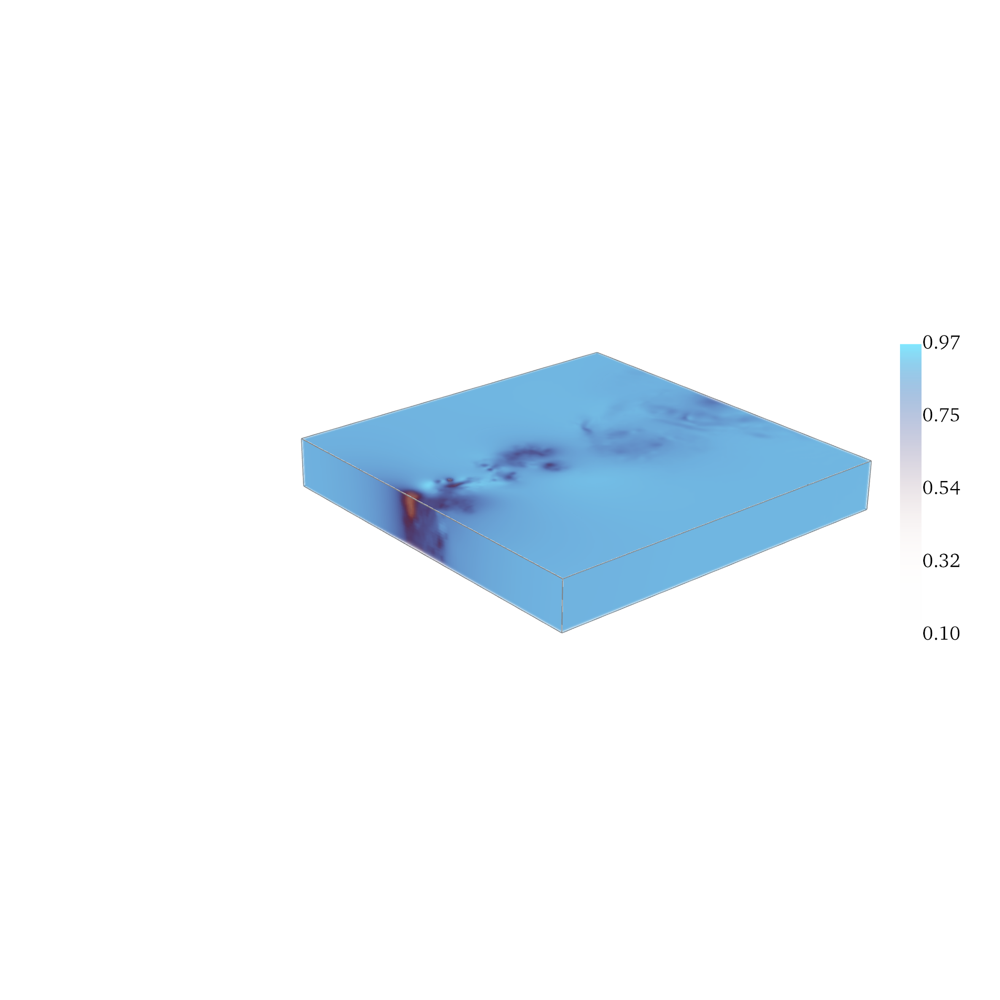

In [21]:
MASK_PERCENT = 0.7
sample_id = 0
f_id = 0
t_id = 0


for x_idx, _, y_idx in test_loader:
    x_idx = x_idx[:6]
    y_idx = y_idx[:6]
    l_fidel = traj_i_test_tensor[0, x_idx].to(device)
    h_fidel = traj_o_test_tensor[0, y_idx].to(device)

    l_fidel, h_true = random_point_inpainting_prep(l_fidel, h_fidel, min_percent=MASK_PERCENT, max_percent=MASK_PERCENT)
    # l_fidel, h_true = reg_invertpainting_prep(l_fidel, h_fidel)

    break

field = h_fidel[sample_id, :].detach().cpu().numpy()
field = field[3]

# mask = l_fidel[sample_id,-1].detach().cpu().numpy()


VMIN = np.min(field)
VMAX = np.max(field)

image = plot_volume_rendering(field, opacity=1, clim=[VMIN,VMAX], CMAP='managua', show_colorbar=True, make_transparent=True)
# image = plot_volume_rendering(field, opacity=0.2, clim=[VMIN,VMAX], CMAP='viridis', show_colorbar=True)
# image = plot_midplane_slices(field, clim=[VMIN,VMAX], CMAP='viridis')


plt.figure(figsize=(10, 10))
plt.imshow(image)
plt.axis("off")
plt.savefig(f'transparent_images/full_pressure.png', transparent=True, dpi=300)
plt.show()

In [22]:

def random_vel_to_pressure(x: torch.Tensor, y: torch.Tensor,
                                  min_percent: float = 0.0, max_percent: float = 1.0):
    """
    x: torch.Tensor of shape [bs, nf, nx, ny, nz]
    y: torch.Tensor of shape [bs, nf, nx, ny, nz]

    Returns:
      x_in: [bs, nf+1, nx, ny, nz] - randomly masked x concatenated with mask
      y   : unchanged target
    """
    bs, nf, nx, ny, nz = x.shape
    device, dtype = x.device, x.dtype
    total_voxels = nx * ny * nz

    # Create empty mask container
    mask = torch.ones((bs, 1, nx, ny, nz), device=device, dtype=dtype)
    zero_mask = torch.zeros((bs, 1, nx, ny, nz), device=device, dtype=dtype)

    for b in range(bs):
        # Sample a random masking percentage for this sample
        masking_percent = random.uniform(min_percent, max_percent)
        num_masked_voxels = int(total_voxels * masking_percent)

        # Generate random indices to mask
        indices = torch.randperm(total_voxels, device=device)[:num_masked_voxels]

        # Convert flat indices to 3D coordinates
        x_idx = indices // (ny * nz)
        y_idx = (indices % (ny * nz)) // nz
        z_idx = indices % nz

        # Apply masking
        mask[b, 0, x_idx, y_idx, z_idx] = 0

    # masking_percent = random.uniform(min_percent, max_percent)
    # rand_field = torch.rand((bs, 1, nx, ny, nz), device=device)
    # mask = (rand_field > masking_percent).float()

    mask = mask.repeat(1,3,1,1,1)
    mask = torch.cat([mask, zero_mask], dim=1)
    
    # Apply the mask to x
    x_masked = x * mask  # broadcast along channel dim

    # Concatenate mask as extra channel
    x_in = torch.cat([x_masked, mask], dim=1)  # [bs, nf+1, nx, ny, nz]

    return x_in, y

torch.Size([6, 8, 256, 256, 32])


sampling time step: 100%|██████████| 32/32 [00:10<00:00,  3.03it/s]
/tmp/ipykernel_2901465/2980876318.py:78: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  u_all = torch.tensor(u_all, dtype=DTYPE, device=device) # [3, ntime, nx, ny, nz]


x: torch.Size([6, 8, 1, 256, 256, 32])
true: torch.Size([6, 4, 1, 256, 256, 32])
true: torch.Size([6, 4, 1, 256, 256, 32])

Saving ...



/tmp/ipykernel_2901465/1402182573.py:119: RuntimeWarning: divide by zero encountered in power
  axes[3].loglog(wave_numbers, wave_numbers**(-5/3), label="slope = -5/3", color="magenta", ls="dotted")


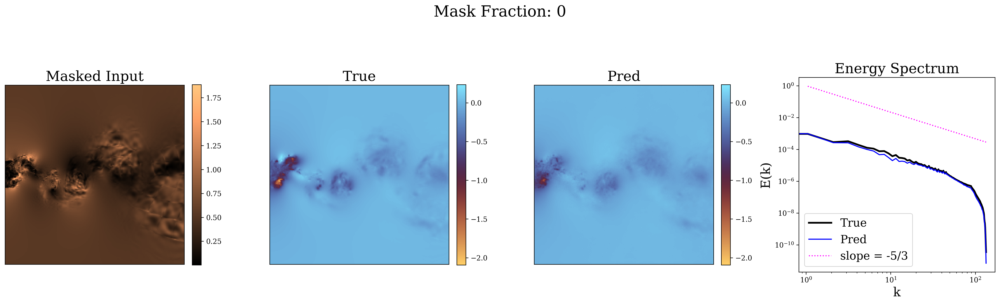

torch.Size([6, 8, 256, 256, 32])


sampling time step: 100%|██████████| 32/32 [00:10<00:00,  3.03it/s]


x: torch.Size([6, 8, 1, 256, 256, 32])
true: torch.Size([6, 4, 1, 256, 256, 32])
true: torch.Size([6, 4, 1, 256, 256, 32])

Saving ...



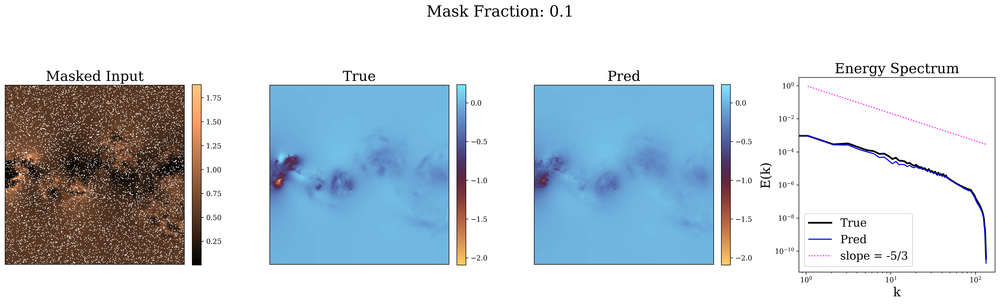

torch.Size([6, 8, 256, 256, 32])


sampling time step: 100%|██████████| 32/32 [00:10<00:00,  3.03it/s]


x: torch.Size([6, 8, 1, 256, 256, 32])
true: torch.Size([6, 4, 1, 256, 256, 32])
true: torch.Size([6, 4, 1, 256, 256, 32])

Saving ...



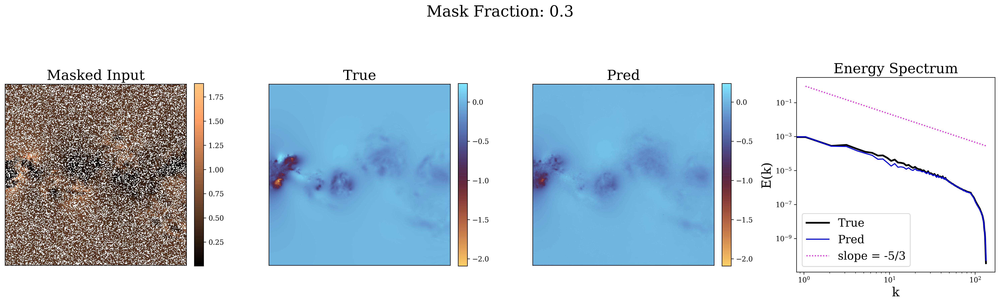

torch.Size([6, 8, 256, 256, 32])


sampling time step: 100%|██████████| 32/32 [00:10<00:00,  3.03it/s]


x: torch.Size([6, 8, 1, 256, 256, 32])
true: torch.Size([6, 4, 1, 256, 256, 32])
true: torch.Size([6, 4, 1, 256, 256, 32])

Saving ...



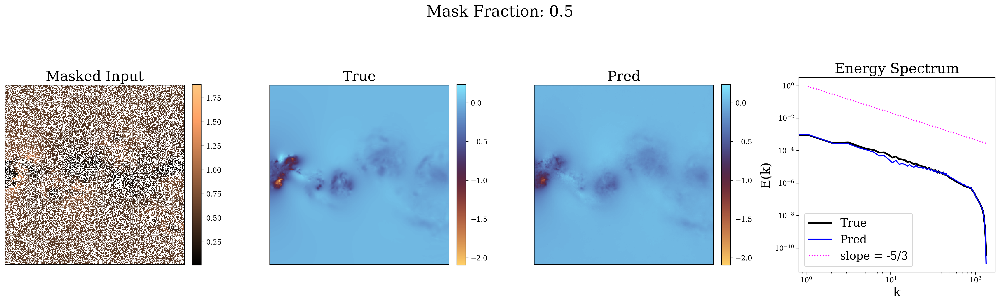

torch.Size([6, 8, 256, 256, 32])


sampling time step: 100%|██████████| 32/32 [00:10<00:00,  3.03it/s]


x: torch.Size([6, 8, 1, 256, 256, 32])
true: torch.Size([6, 4, 1, 256, 256, 32])
true: torch.Size([6, 4, 1, 256, 256, 32])

Saving ...



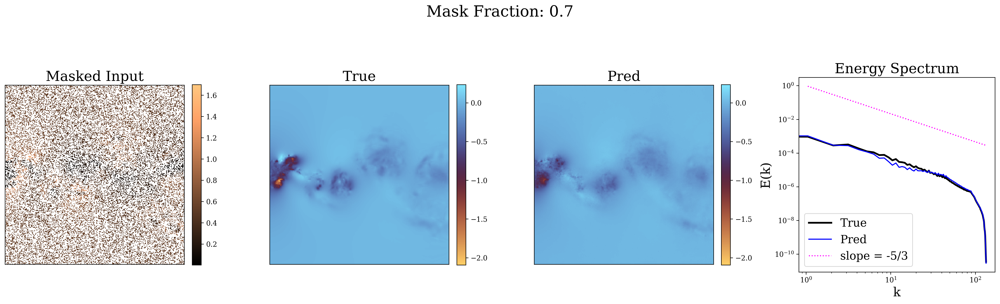

torch.Size([6, 8, 256, 256, 32])


sampling time step: 100%|██████████| 32/32 [00:10<00:00,  3.03it/s]


x: torch.Size([6, 8, 1, 256, 256, 32])
true: torch.Size([6, 4, 1, 256, 256, 32])
true: torch.Size([6, 4, 1, 256, 256, 32])

Saving ...



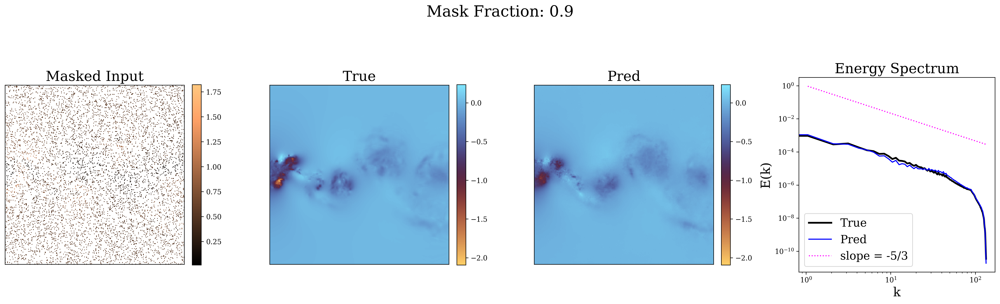

torch.Size([6, 8, 256, 256, 32])


sampling time step: 100%|██████████| 32/32 [00:10<00:00,  3.03it/s]


x: torch.Size([6, 8, 1, 256, 256, 32])
true: torch.Size([6, 4, 1, 256, 256, 32])
true: torch.Size([6, 4, 1, 256, 256, 32])

Saving ...



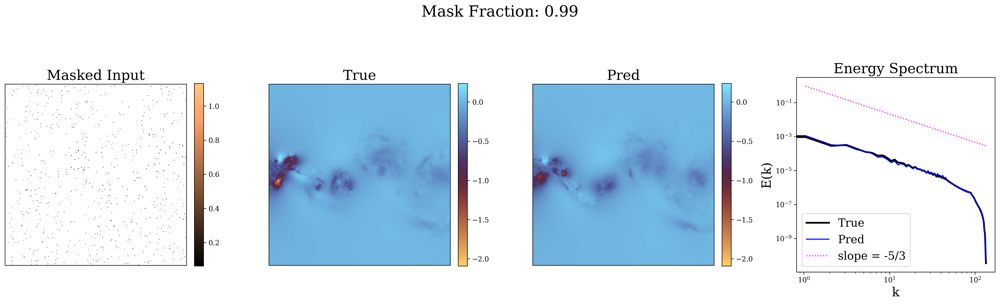

In [23]:
torch.manual_seed(23)


for mp in [0, 0.1, 0.3, 0.5, 0.7, 0.9, 0.99]:
# for mp in [1.0]:
        
    MASK_PERCENT = mp
    
    l_fidel_ls = []
    y_pred_ls = []
    y_true_ls = []
    
    model.eval()
    test_loss = 0.0
    with torch.no_grad():
        for x_idx, _, y_idx in test_loader:
            x_idx = x_idx[:6]
            y_idx = y_idx[:6]
            l_fidel = traj_i_test_tensor[0, x_idx].to(device)
            h_fidel = traj_o_test_tensor[0, y_idx].to(device)

    
            l_fidel, h_true = random_vel_to_pressure(l_fidel, h_fidel, min_percent=MASK_PERCENT, max_percent=MASK_PERCENT)
            print(l_fidel.shape)
    
            if True:
                pred = model.sample(l_fidel.to(device), num_sample_steps=32)
                loss   = error_metric(pred, h_fidel.to(device), Par)
            test_loss += loss.item()
            l_fidel_ls.append(l_fidel)
            y_true_ls.append(h_fidel)
            y_pred_ls.append(pred)
            break
    
    x, true, pred = l_fidel, h_fidel, y_pred_ls[0]  
    
    
    x    = x.unsqueeze(2)
    true = true.unsqueeze(2)
    pred = pred.unsqueeze(2)

    print(f'x: {x.shape}')
    print(f'true: {true.shape}')
    print(f'true: {true.shape}')
    
    sample_id = 0 #random.randint(0, x.shape[0]-1)
    f_id = 3
    t_id = 0
    z_id = 16
    
    CMAP = "managua"
    
    lx,ly,lz = 8,8,2
    
    knyquist, wave_numbers, spectrum_true = compute_tke_spectrum_timeseries_torch( true[sample_id, :3], lx,ly,lz, device=device  )
    knyquist, wave_numbers, spectrum_pred = compute_tke_spectrum_timeseries_torch( pred[sample_id, :3], lx,ly,lz, device=device  )
    
    
    s_err = np.mean( (np.log(spectrum_true[:,:])-np.log(spectrum_pred[:,:]) )**2 )

    MASK_og = x[:, 4:]
    MASK = x[sample_id, -1, t_id, :, :, z_id]
    MASK = MASK.detach().cpu().numpy()

    MASK_vel = x[sample_id, -2, t_id, :, :, z_id].detach().cpu().numpy()

    x = x[:,:4] * Par['inp_scale'].permute(0,2,1,3,4,5) + Par['inp_shift'].permute(0,2,1,3,4,5)
    true = true * Par['out_scale'].permute(0,2,1,3,4,5) + Par['out_shift'].permute(0,2,1,3,4,5)
    pred = pred * Par['out_scale'].permute(0,2,1,3,4,5) + Par['out_shift'].permute(0,2,1,3,4,5)

    print()
    print('Saving ...')
    os.makedirs('vel_to_pressure', exist_ok=True)
    np.savez(f'vel_to_pressure/data_{mp}.npz', x=x.detach().cpu().numpy(), true=true.detach().cpu().numpy(), pred=pred.detach().cpu().numpy(), MASK_og=MASK_og.detach().cpu().numpy())

    print()
    
    
    X = x[sample_id, f_id, t_id, :, :, z_id].detach().cpu().numpy()
    T = true[sample_id, f_id, t_id, :, :, z_id].detach().cpu().numpy()
    P = pred[sample_id, f_id, t_id, :, :, z_id].detach().cpu().numpy()

    ke = get_ke(x[sample_id, :, t_id, :, :, z_id].detach().cpu().numpy())

    
    
    masked_X = np.ma.masked_where(MASK_vel == 0,  ke) 
    
    VMIN = np.min(T)
    VMAX = np.max(T)
    # VMIN = -1
    # VMAX = +

    
    fig, axes = plt.subplots(1,4, figsize=(20,5))
    im = axes[0].imshow(masked_X, cmap='copper', interpolation='none')
    axes[0].set_title("Masked Input", fontsize=20)
    fig.colorbar(im, ax=axes[0], fraction=0.046, pad=0.04)
    axes[0].set_xticks([])
    axes[0].set_yticks([])
    
    im = axes[1].imshow(T, cmap=CMAP, vmin=VMIN, vmax=VMAX)
    axes[1].set_title("True", fontsize=20)
    fig.colorbar(im, ax=axes[1], fraction=0.046, pad=0.04)
    axes[1].set_xticks([])
    axes[1].set_yticks([])
    
    im = axes[2].imshow(P, cmap=CMAP, vmin=VMIN, vmax=VMAX)
    axes[2].set_title("Pred", fontsize=20)
    fig.colorbar(im, ax=axes[2], fraction=0.046, pad=0.04)
    axes[2].set_xticks([])
    axes[2].set_yticks([])

    
    axes[3].loglog(wave_numbers, spectrum_true[t_id], label="True", color="black", lw=2.5)
    axes[3].loglog(wave_numbers, spectrum_pred[t_id], label="Pred", color="blue", lw=1.5)
    axes[3].loglog(wave_numbers, wave_numbers**(-5/3), label="slope = -5/3", color="magenta", ls="dotted")
    axes[3].legend(fontsize=16)
    axes[3].set_title('Energy Spectrum', fontsize=20)
    axes[3].set_xlabel("k", fontsize = 18)
    axes[3].set_ylabel("E(k)", fontsize=18)
    
    
    
    plt.tight_layout()
    
    
    fig.suptitle(f"Mask Fraction: {MASK_PERCENT}", fontsize=22, y=1.2)
    plt.show()
    # plt.savefig(f"images/{epoch}.png", dpi=150, bbox_inches='tight')
    plt.close()